# Problem Statement

The aim of project is to Use clustering algorithms to categorize similar players using their traits and their different skills in the field.


# Task 1 : Data Analysis Report

1 Data Cleaning:

2 Exploratory Data Analysis (EDA)

3 Feature Analysis

4 Visualizations


# Task 2: Clustering Football Players

Clustering Techniques:
1 K-Means clustering.
2 Hierarchical clustering.
3 GMM Clustering

Cluster Analysis:
Interpret the clusters and identify patterns or common characteristics.

# Task 3: Data Exploration and Specific Questions

1 Top 10 Countries with Most Players.
2 Distribution of Overall Rating vs. Age.
3 Highest Paid Offensive Players.
4 Filter offensive players (striker, right-winger, left-winger).
5 Determine which position tends to get paid the most.

# Domain Analysis

FIFA 20, released on September 27, 2019, is the 27th installment in the FIFA series. It is available on Microsoft Windows, PlayStation 4, Xbox One, and Nintendo Switch. The game introduces VOLTA Football, a new mode focusing on street football, reminiscent of FIFA Street. VOLTA offers three vs. three, four vs. four, and five vs. five matches, as well as professional futsal rules. This mode emphasizes skill and independent play, using the same engine as the traditional FIFA matches.

# Importing Necessary Librabries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import plotly.graph_objects as go
from math import pi
from mpl_toolkits.mplot3d import Axes3D
from statistics import median,mode
import plotly.express as px
from plotly.subplots import make_subplots
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool
from bokeh.layouts import gridplot
output_notebook()
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans


C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.2' currently installed).
  from pandas.core import (


Loading BokehJS ...

# Importing Dataset

In [2]:
data = pd.read_csv('players_20.csv',na_filter=['+#'])
pd.set_option('display.max_columns',None)
data.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW,7.0,NaN,2019-07-01,

# Basic Checks

In [3]:
data.sample(5)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
11586,223139,https://sofifa.com/player/223139/akim-zedadka/...,A. Zedadka,Akim Zedadka,24,1995-05-30,173,72,France,Clermont Foot 63,64,68,525000,1000,RB,Right,1,2,2,High/Medium,Lean,No,958000.0,NaN,SUB,19.0,NaN,2019-06-18,2022.0,NaN,NaN,81.0,53.0,53.0,68.0,58.0,59.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63,54,47,60,51,67,54,47,39,68,82,81,77,55,78,59,43,76,57,42,48,55,55,42,57,56,58,63,61,11,12,11,11,7,58+2,58+2,58+2,62+2,60+2,60+2,60+2,62+2,58+2,58+2,58+2,62+2,55+2,55+2,55+2,62+2,64+2,57+2,57+2,57+2,64+2,63+2,57+2,57+2,57+2,63+2
7423,193645,https://sofifa.com/player/193645/davide-gavazz...,D. Gavazzi,Davide Gavazzi,33,1986-05-07,185,73,Italy,Pordenone,68,68,525000,2000,"CM, CDM",Right,1,4,3,Medium/Medium,Lean,No,814000.0,NaN,LCM,7.0,NaN,2018-07-19,2020.0,NaN,NaN,72.0,63.0,66.0,68.0,59.0,69.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65,60,59,70,51,65,60,51,67,69,74,70,74,66,77,71,75,74,69,70,61,65,62,65,51,67,64,51,51,4,10,13,6,13,65+2,65+2,65+2,66+2,66+2,66+2,66+2,66+2,66+2,66+2,66+2,67+2,66+2,66+2,66+2,67+2,64+2,64+2,64+2,64+2,64+2,63+2,61+2,61+2,61+2,63+2
18210,243725,https://sofifa.com/player/243725/darren-collin...,D. Collins,Darren Collins,18,2000-09-29,173,68,Republic of Ireland,Sligo Rovers,49,62,50000,1000,"ST, RW",Right,1,3,2,Medium/Medium,Normal,No,109000.0,NaN,SUB,26.0,NaN,2018-05-25,2019.0,NaN,NaN,67.0,49.0,43.0,53.0,31.0,33.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40,49,30,42,48,52,53,50,33,50,68,67,66,44,63,50,45,31,31,48,37,22,53,52,40,50,39,29,27,6,9,5,13,8,47+2,47+2,47+2,51+2,50+2,50+2,50+2,51+2,49+2,49+2,49+2,48+2,42+2,42+2,42+2,48+2,39+2,35+2,35+2,35+2,39+2,38+2,33+2,33+2,33+2,38+2
13748,211050,https://sofifa.com/player/211050/franck-ohandz...,F. Ohandza,Frank Ohandza Zoa,27,1991-09-28,179,83,Cameroon,Henan Jianye FC,62,63,350000,3000,"ST, CF",Right,1,4,3,High/Low,Normal,No,569000.0,NaN,SUB,14.0,NaN,2019-02-28,2019.0,NaN,NaN,67.0,61.0,44.0,64.0,26.0,59.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31,67,53,62,50,64,40,36,30,62,69,65,69,60,71,61,69,52,72,56,31,15,55,40,49,60,34,20,15,15,9,7,13,8,61+2,61+2,61+2,58+2,60+2,60+2,60+2,58+2,57+2,57+2,57+2,55+2,49+2,49+2,49+2,55+2,41+2,39+2,39+2,39+2,41+2,39+2,38+2,38+2,38+2,39+2
9319,221475,https://sofifa.com/player/221475/chan-dong-lee...,Lee Chan Dong,이찬동 李灿东,26,1993-01-10,183,83,Korea Republic,Sangju Sangmu FC,66,69,775000,2000,"CM, RM",Right,1,3,2,Medium/High,Stocky,No,NaN,NaN,SUB,38.0,Jeju United FC,NaN,2020.0,NaN,NaN,58.0,58.0,62.0,62.0,68.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,46,53,65,67,53,59,58,60,64,64,62,54,69,64,64,70,32,78,81,60,83,69,57,68,53,55,68,68,65,9,10,8,13,12,61+2,61+2,61+2,59+2,61+2,61+2,61+2,59+2,62+2,62+2,62+2,60+2,65+2,65+2,65+2,60+2,63+2,68+2,68+2,68+2,63+2,64+2,68+2,68+2,68+2,64+2


Insights :
    1 there are 104 columns and 5 rows.

In [4]:
data.tail()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,48,56,40000,2000,CB,Right,1,3,2,Medium/High,Normal,No,70000.0,NaN,RES,36.0,NaN,2018-07-13,2019.0,NaN,NaN,57.0,23.0,28.0,33.0,47.0,51.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21,17,40,35,27,24,23,21,28,35,56,58,45,40,73,36,70,60,47,16,46,48,28,25,39,41,45,50,52,5,5,13,5,14,32+2,32+2,32+2,31+2,31+2,31+2,31+2,31+2,31+2,31+2,31+2,33+2,33+2,33+2,33+2,33+2,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,48,56,40000,2000,CB,Right,1,2,2,Medium/Medium,Normal,No,72000.0,NaN,SUB,31.0,NaN,2019-02-01,2022.0,NaN,NaN,58.0,24.0,33.0,35.0,48.0,48.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24,20,42,43,28,32,24,29,39,31,55,61,43,41,76,33,72,55,44,20,42,49,23,25,37,35,42,53,57,13,6,14,11,9,33+2,33+2,33+2,33+2,32+2,32+2,32+2,33+2,33+2,33+2,33+2,35+2,36+2,36+2,36+2,35+2,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,48,56,40000,1000,CM,Right,1,2,2,Low/Medium,Lean,No,70000.0,NaN,SUB,38.0,NaN,2019-01-01,2019.0,NaN,NaN,54.0,35.0,44.0,45.0,48.0,51.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32,33,49,53,32,40,32,32,55,49,55,54,52,52,57,48,60,50,51,26,50,45,38,38,36,39,46,52,46,7,8,10,6,14,43+2,43+2,43+2,43+2,43+2,43+2,43+2,43+2,44+2,44+2,44+2,45+2,46+2,46+2,46+2,45+2,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,48,54,40000,1000,CM,Right,1,2,2,Low/Low,Lean,No,70000.0,NaN,SUB,33.0,NaN,2019-02-01,2022.0,NaN,NaN,59.0,35.0,47.0,47.0,45.0,52.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39,34,47,54,28,42,37,39,48,49,55,63,55,54,59,46,61,42,55,28,57,49,31,48,36,40,39,44,54,14,9,13,13,13,43+2,43+2,43+2,45+2,44+2,44+2,44+2,45+2,46+2,46+2,46+2,46+2,46+2,46+2,46+2,46+2,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2
18277,233449,https://sofifa.com/player/233449/ximing-pan/20...,Pan Ximing,潘喜明,26,1993-01-11,182,78,China PR,Hebei China Fortune FC,48,51,40000,2000,CM,Right,1,3,2,Medium/Medium,Normal,No,NaN,NaN,SUB,37.0,Tianjin TEDA FC,NaN,2019.0,NaN,NaN,60.0,32.0,51.0,45.0,47.0,55.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44,30,48,58,25,40,34,35,52,46,54,64,52,49,71,41,64,40,61,30,54,47,29,52,38,42,52,42,48,8,12,14,9,10,42+2,42+2,42+2,44+2,43+2,43+2,43+2,44+2,46+2,46+2,46+2,46+2,46+2,46+2,46+2,46+2,48+2,49+2,49+2,49+2,48+2,48+2,50+2,50+2,50+2,48+2


In [5]:
data.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 104 entries, sofifa_id to rb
dtypes: float64(16), int64(45), object(43)
memory usage: 14.5+ MB


In this data all type of data is available[float=16. int=45, object=43]

In [6]:
data.select_dtypes(include=['object']).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 43 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   player_url        18278 non-null  object
 1   short_name        18278 non-null  object
 2   long_name         18278 non-null  object
 3   dob               18278 non-null  object
 4   nationality       18278 non-null  object
 5   club              18278 non-null  object
 6   player_positions  18278 non-null  object
 7   preferred_foot    18278 non-null  object
 8   work_rate         18278 non-null  object
 9   body_type         18278 non-null  object
 10  real_face         18278 non-null  object
 11  player_tags       1499 non-null   object
 12  team_position     18038 non-null  object
 13  loaned_from       1048 non-null   object
 14  joined            16990 non-null  object
 15  nation_position   1126 non-null   object
 16  player_traits     7566 non-null   object
 17  ls          

In [7]:
data.select_dtypes(exclude=['object']).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 61 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   sofifa_id                   18278 non-null  int64  
 1   age                         18278 non-null  int64  
 2   height_cm                   18278 non-null  int64  
 3   weight_kg                   18278 non-null  int64  
 4   overall                     18278 non-null  int64  
 5   potential                   18278 non-null  int64  
 6   value_eur                   18278 non-null  int64  
 7   wage_eur                    18278 non-null  int64  
 8   international_reputation    18278 non-null  int64  
 9   weak_foot                   18278 non-null  int64  
 10  skill_moves                 18278 non-null  int64  
 11  release_clause_eur          16980 non-null  float64
 12  team_jersey_number          18038 non-null  float64
 13  contract_valid_until        180

In [8]:
data.shape

(18278, 104)

In [9]:
data.size

1900912

Insights: 
    There are 61 numerical column and 43 categorical column.
    There are total 18278 entries and 104 columns.
    There are a total of 48 columns containing null values in both numerical     and categorical columns
    
    
    

In [10]:
data.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,18278.000000,1.698000e+04,18038.000000,18038.000000,1126.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,2.368038,4.740717e+06,20.103892,2021.114591,12.114565,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,49.718405,45.590218,52.221468,58.748003,42.809388,55.596509,47.325692,42.708885,52.768848,58.461976,64.299923,64.415746,63.504924,61.752544,63.856439,58.181694,64.928165,62.889485,65.234763,46.812945,55.742149,46.380239,50.072163,53.609749,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,0.765038,1.103002e+07,16.603639,1.289888,6.735922,11.297656,14.029418,10.407844,10.284950,16.419528,9.760162,7.736278,7.244023,7.510709,8.154062,10.634038,8.447876,18.325403,19.594609,17.428429,14.679653,17.701815,18.929118,18.422991,17.433612,15.246454,16.741878,15.042232,14.847763,14.808380,9.135613,14.201559,13.326083,11.934059,16.017954,12.534811,19.322343,17.318157,20.775812,19.594022,13.955626,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,1.300000e+04,1.000000,2019.000000,1.000000,24.000000,15.000000,24.000000,23.000000,15.000000,27.000000,44.000000,42.000000,35.000000,45.000000,12.000000,41.000000,5.000000,2.000000,5.000000,7.000000,3.000000,4.000000,6.000000,4.000000,8.000000,5.000000,12.000000,11.000000,11.000000,21.000000,12.000000,14.000000,19.000000,12.000000,20.000000,4.000000,9.000000,3.000000,2.000000,9.000000,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,2.000000,5.630000e+05,9.000000,2020.000000,6.000000,61.000000,42.000000,50.000000,57.000000,36.000000,59.000000,60.000000,58.000000,57.000000,60.750000,29.000000,58.000000,38.000000,30.000000,44.000000,54.000000,30.000000,50.000000,34.000000,31.000000,43.000000,54.000000,56.000000,57.

 Insights:
 1 The youngest player is 16 years old. and oldest player age is 42    year old.
 2 hight and weight are normally distributed.
 3 The average age of the players is around 25 years old, with a standard deviation of 4.66 years. The minimum age is 16, and      the maximum age is 42.
 4 The average player value is around €2.48 million, with significant variation,while the minimum player value is € 0.0
 5 The minimum value and wage paid to players are found to be 0 euros.
 6 The majority of players (75%) have an international reputation rating of 1 on a scale from 1 to 5, indicating that most          players are not widely recognized internationally.
 7 The columns sofifa_id, team_jersey_number, and nation_jersey_number are generally irrelevant as they do not provide              information about the players'abilities or attributes. They mainly serve as identifiers or categorical information.
 8 gk_diving,gk_handling,gk_kicking, gk_reflexes,gk_speed,gk_positioning columns have only 2036 entries.
 9 The average ratings for players' movement skills are notable: sprint speed averages at 64, agility at 63, and reactions at      61. Among these, the highest observed rating for exceptional movement skills reaches up to 96.
 10 On average, most players exhibit moderate proficiency with their weaker      foot, with a rating averaging around 2.9 on a       scale of 1 to 5.
 11 Pace ranges from 24 to 96, with 25% of players are much faster than others having rating above 75.

In [11]:
data.describe(include='O')

,player_url,short_name,long_name,dob,nationality,club,player_positions,preferred_foot,work_rate,body_type,real_face,player_tags,team_position,loaned_from,joined,nation_position,player_traits,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
count,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,1499,18038,1048,16990,1126,7566,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242
unique,18278,17354,18218,6142,162,698,643,2,9,10,2,83,29,316,1760,26,921,94,94,94,107,103,103,103,107,103,103,103,100,88,88,88,100,98,98,98,98,98,96,110,110,110,96
top,https://sofifa.com/player/158023/lionel-messi/...,J. Rodríguez,Liam Kelly,1992-02-29,England,FC Barcelona,CB,Right,Medium/Medium,Normal,No,#Strength,SUB,Sassuolo,2019-07-01,SUB,Early Crosser,61+2,61+2,61+2,63+2,63+2,63+2,63+2,63+2,61+2,61+2,61+2,61+2,58+2,58+2,58+2,61+2,59+2,59+2,59+2,59+2,59+2,61+2,63+2,63+2,63+2,61+2
freq,1,11,3,113,1667,33,2322,13960,9875,10750,16310,514,7820,17,1465,587,501,725,725,725,736,727,727,727,736,748,748,748,809,775,775,775,809,682,636,636,636,682,667,621,621,621,667


Insights:
    
1 Columns like player_url, long_name, and dob are considered unnecessary for clustering players based on their skills.
2 Players in the dataset originate from a wide spectrum of 162 countries globally.
3 Columns like player_tags, loaned_from, and nation_position have a significant number of missing entries, indicating that
more than 90% of the entries are null.
4 ls, st, rs, lw, lf, cf, rf, rw, lam, cam, ram, lm, lcm, cm, rcm, rm: These columns likely represent player ratings or
attributes in different positions or roles on the field.
5 lwb, ldm, cdm, rdm, rwb, lb, lcb, cb, rcb, rb: These columns typically represent defensive ratings or attributes in
different positions on the field.
6 About 41% of the players in the dataset have detailed information regarding their specific traits, indicating that a 
considerable portion of the dataset is missing comprehensive descriptions of individual player characteristics.
7 Approximately 74.54% of the players in the dataset are predominantly right-footed when playing


# EDA

# Univariate Analysis

In [12]:
data = data.replace('[\#]','',regex=True)

In [13]:
# Split the column and remove the '+' with the values after them
columns = ['ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm',
           'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb']
data[columns]

for colmun in columns: # for itertion of columns
    data[colmun] = data[colmun].str.split('+',expand=True)[0] # Split of string
data.head(1)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"Dribbler, Distance Shooter, Crosser, FK Specia...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63


In [14]:
univariate = data[[ 'age',  'height_cm', 'weight_kg','overall', 'potential', 'value_eur', 'wage_eur', 
                   'preferred_foot', 'international_reputation', 'weak_foot', 'skill_moves', 'work_rate', 'body_type',
                   'real_face', 'release_clause_eur', 'player_tags', 'team_position', 'team_jersey_number', 
                   'contract_valid_until', 'nation_position', 'nation_jersey_number', 'pace', 'shooting', 'passing',
                   'dribbling', 'defending', 'physic', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed', 
                   'gk_positioning','attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy',
                   'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 
                   'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 
                   'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 
                   'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
                   'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking',
                   'defending_standing_tackle', 'defending_sliding_tackle', 'goalkeeping_diving', 'goalkeeping_handling', 
                   'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes', 'ls', 'st', 'rs', 'lw', 'lf', 
                   'cf', 'rf', 'rw', 'lam','cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb',
                   'lb', 'lcb', 'cb', 'rcb', 'rb']]
import sweetviz
sv = sweetviz.analyze(univariate)
sv.show_html() #Generate default argument

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


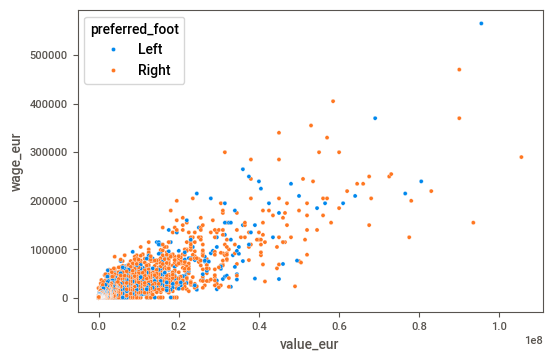

In [15]:
sns.scatterplot(x='value_eur',y='wage_eur',data=data,color='brown',hue='preferred_foot')
plt.show()

OBSERVATION:
If player value is less then the wage of player also less.
If the value of player is more the wage is silghtly more.

<Axes: title={'center': 'Age Distribution of goal-keepers in fifa 20'}, xlabel='age', ylabel='Density'>

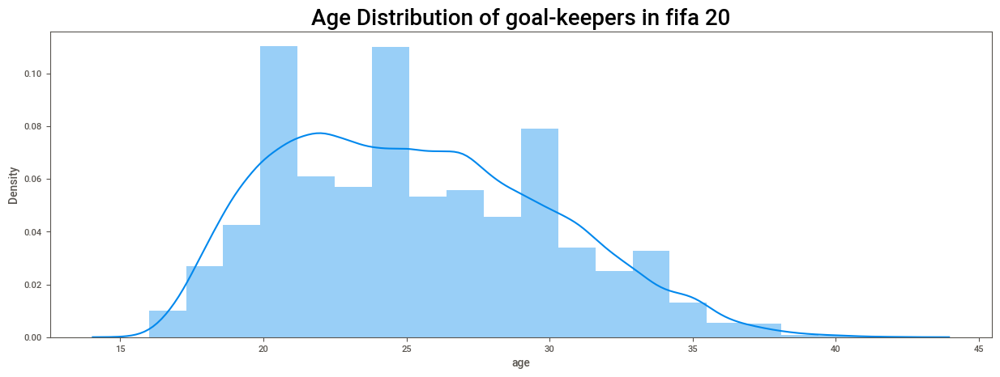

In [16]:
plt.figure(figsize=(15,5))
plt.title('Age Distribution of goal-keepers in fifa 20',fontsize=20)
sns.distplot(a=data['age'],kde=True,bins=20)

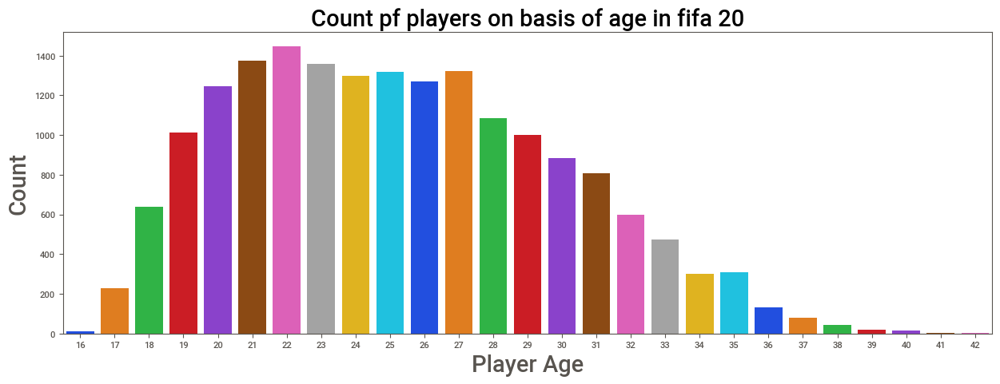

In [17]:
plt.figure(figsize=(15,5))
a=sns.countplot(x='age',data=data,palette='bright')
a.set_title(label='Count pf players on basis of age in fifa 20',fontsize=21)
a.set_xlabel(xlabel='Player Age',fontsize=21)
a.set_ylabel(ylabel='Count',fontsize=21)
plt.show()

Insights:
    The of maximum players age lies between 20 to 30.
    The minimum age is 16 and maximum age is 42.

In [18]:
data['nationality'].value_counts().head()

nationality
England      1667
Germany      1216
Spain        1035
France        984
Argentina     886
Name: count, dtype: int64

Insights:
1 The of maximum players age lies between 20 to 30.L
2 The average height of players is approximately 180 cm.
3 Most players weight between 65 to 80 kg, with the weight distribution also following a normal pattern
4 General performance quality and value of the player representing the key positional skills and international reputation rated between 65-70 and only fes has above 80.
5 Maximum Overall rating expected to be reached by a player in the top of his career rated between 65-80.
6 pace is skewed to left and players have rating between 60-80.
7 The skills for shooting, passing, dribbling, and defending are predominantly rated between 60 and 65. This indicates that most players possess a moderate level of technical skills
8 Most players tend to have a physic attribute rating ranging from 65 to 70, indicating that a significant portion of players exhibit strong physical strength and endurance.
9 Agility ,Gracefulness and quickness of the player while controlling the ball rated between 60-80.
    

In [19]:
reputation=data.international_reputation.value_counts().index.to_list()
count=data.international_reputation.value_counts().values
foot=data.preferred_foot.value_counts().index.to_list()
foot_count=data.preferred_foot.value_counts().values

work=data.work_rate.value_counts().index.to_list()
work_count=data.work_rate.value_counts().values

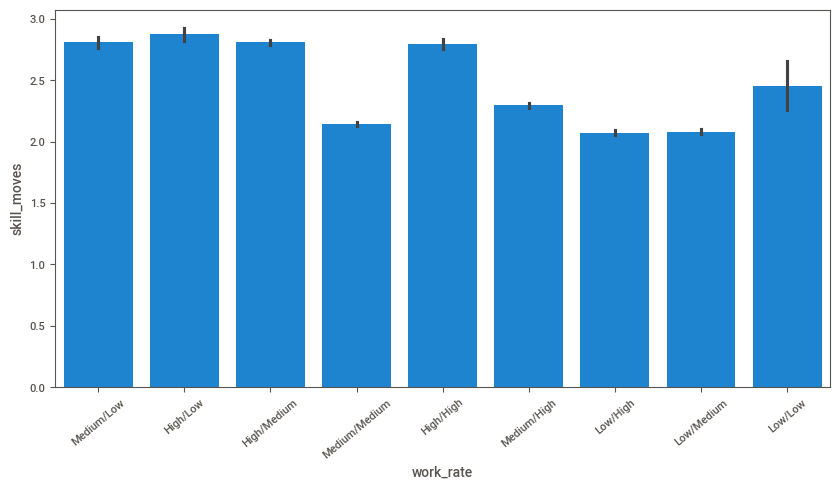

In [20]:
plt.figure(figsize=(10,5))
sns.barplot(x='work_rate',y='skill_moves',data=data)
plt.xticks(rotation=40)
plt.show()

In [21]:
fig1 = px.pie(names=reputation, values=count, title='International Reputation Rating',width=400, height=400, hole=0.3, color_discrete_sequence=px.colors.qualitative.Dark2)
fig1.show()


In [22]:
fig2 = px.pie(names=work, values=work_count, title='Distribution of Work Rate',
 width=450, height=450, hole=0.3)
fig2

Insights:
    1 17.6% players demonstrate high work rate.
    2 54% of players demonstrate a medium work rate in both attacking and defensive roles. This indicates that the majority of players maintain a balanced level of effort and participation in both offensive and defensive activities, making them versatile assets on the field.

Text(0.5, 1.0, 'count of players on basis on preferred foot in fifa20')

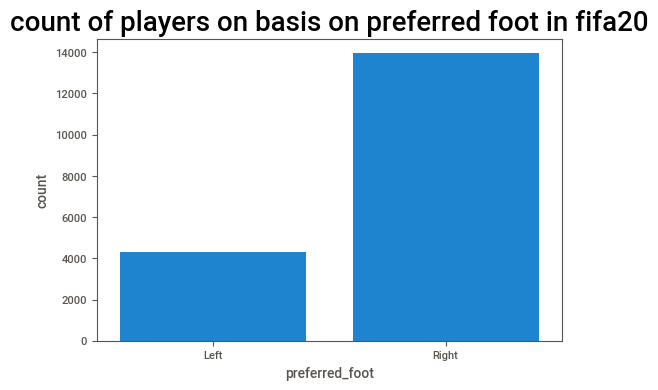

In [23]:
a=sns.countplot(x='preferred_foot',data=data,palette=None)
a.set_title(label='count of players on basis on preferred foot in fifa20',fontsize=20)


Insight:
    76.4% player prefer right foot and 23.6% player prefer left foot

In [24]:
cat_cols = ['body_type', 'team_position']
fig = make_subplots(rows=len(cat_cols), cols=1, subplot_titles=cat_cols)
for i, col in enumerate(cat_cols):
    fig.add_trace(
        px.bar(
            data[col].value_counts(), 
            x=data[col].value_counts().index, 
            y=data[col].value_counts().values,
            labels={'x': col, 'y': 'Frequency'}, 
            color_discrete_sequence=['green']
        ).data[0], 
        row=i+1, 
        col=1
    )

# Update the layout of the figure
fig.update_layout(height=500*len(cat_cols), width=800, title='Categorical Column Distributions')

# Show the figure
fig.show()


Insights:
    1 Roughly 58.8% of players are identified with a normal body type, and about 35.5% are categorized as having a lean body type

Prepare a rank ordered list of top 10 countries with most players. Which
countries are producing the most footballers that play at this level?

In [25]:
a1=data.nationality.value_counts().index.to_list()
b1=data.nationality.value_counts().values
a2=data.club.value_counts().index.to_list()
b2=data.club.value_counts().values

In [26]:
x1=a1[0:10]
y1=b1[0:10]

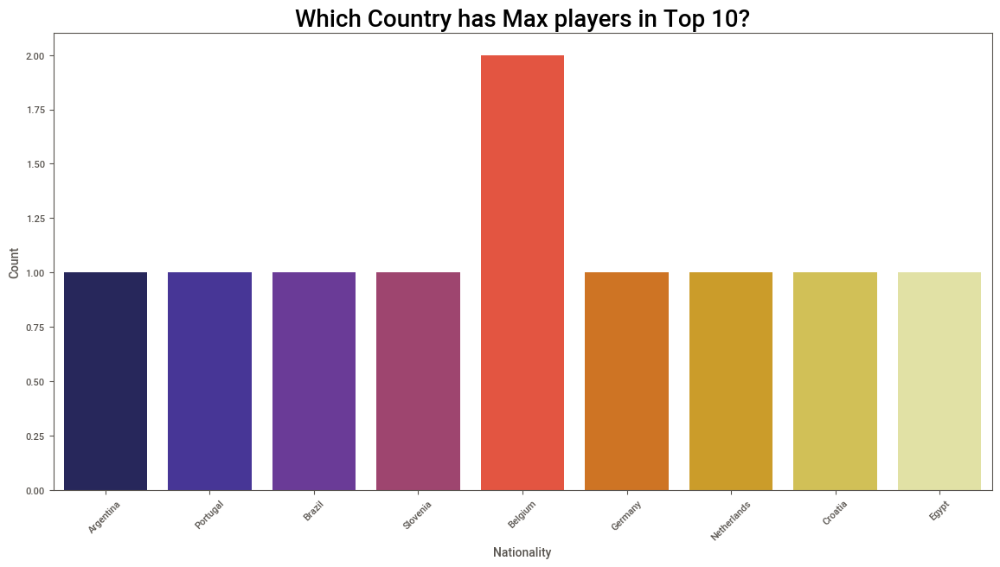

In [27]:
plt.figure(figsize=(14, 7))
sns.countplot(x='nationality', data=data.head(10), palette='CMRmap')
plt.xlabel('Nationality')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Used to tilt the names on the x-axis
plt.title('Which Country has Max players in Top 10?', fontsize=20)
plt.show()


Insights:
    Most of the belgium country player in to 10

In [28]:
fig1=px.bar(x=a1,y=b1,color_discrete_sequence=['navy'])
fig1.update_layout(
 title='Distribution of Players of top 10 Nationalities',
 xaxis_title='Nationality',
 yaxis_title='Frequency',
 title_font=dict(size=20, family='Arial', color='orange'),title_x=0.5, title_y=0.95
 )

Insight:
    1 top 10 nationalities are from england,germany,spain,france,argentina,brazil,italy,colombia,japan,netherlands.
    

# CAMPARE MESSI VS RONALDO


In [29]:
feature = data[['short_name','overall','potential','pace','shooting','passing','dribbling','defending','physic']]
compare = feature.head(2)
compare = compare.set_index('short_name')
compare.head()

,overall,potential,pace,shooting,passing,dribbling,defending,physic
short_name,,,,,,,,
L. Messi,94,94,87.0,92.0,92.0,96.0,39.0,66.0
Cristiano Ronaldo,93,93,90.0,93.0,82.0,89.0,35.0,78.0


# Bivariate Analysis

Q Plot the distribution of overall rating vs. age of players. Interpret what is the
age after which a player stops improving?

In [30]:

fig = px.scatter(data, x='age', y='overall',
                 title='Distribution of Overall Rating vs. Age',
                 labels={'age': 'Age', 'overall': 'Overall Rating'},
                 color='overall',  # Optionally, color by overall rating
                 color_continuous_scale='Viridis')  # Color scale


fig.update_layout(
    title='Distribution of Overall Rating vs. Age',
    xaxis_title='Age',
    yaxis_title='Overall Rating',
    title_font=dict(size=20, family='Arial', color='orange'),
    xaxis=dict(range=[data['age'].min(), data['age'].max()]),
    yaxis=dict(range=[data['overall'].min(), data['overall'].max()])
)


fig.show()


Insights:
    1 The range of overall ratings is largest in the 20-30 age group, indicating more variability in player performance during this period.
    2 players gain experience and skills as they age, physical attributes may start to decline after a certain age.
    3 the overall rating peaks in the mid-30s, with an average rating of around 80-85.
    4 There is a significant drop in overall rating after the age of 40, with an average rating of around 50-60.
    5  The highest overall rating is around 90, which is achieved by players in their mid-to-late 20s.

Q Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger?

In [31]:
positions_of_interest = ['ST', 'RW', 'LW']

df_filtered = data[data['player_positions'].str.contains('|'.join(positions_of_interest))]


fig = px.box(df_filtered, x='player_positions', y='wage_eur',
             title='Salary Distribution by Offensive Position',
             labels={'player_positions': 'Offensive Position', 'wage_eur': 'Salary'},
             color='player_positions')


fig.update_layout(
    title='Salary Distribution by Offensive Position',
    xaxis_title='Offensive Position',
    yaxis_title='Salary',
    title_font=dict(size=20, family='Arial', color='navy'),
    xaxis=dict(tickangle=-45),  # Rotate x-axis labels for better readability
    yaxis=dict(tickprefix='$')
)

# Show the figure
fig.show()

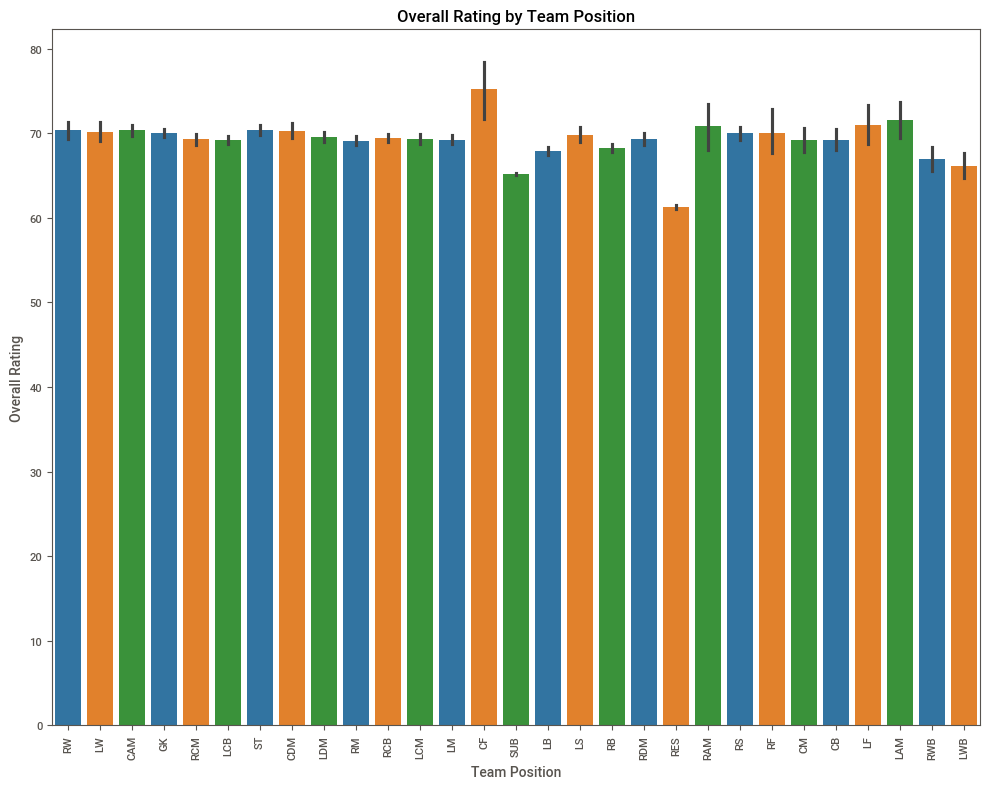

In [32]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c'] 
plt.figure(figsize=(10, 8))
sns.barplot(data=data, x='team_position', y='overall', palette=colors)
plt.title('Overall Rating by Team Position')
plt.xlabel('Team Position')
plt.ylabel('Overall Rating')
plt.xticks(rotation=90)  

# Show the plot
plt.tight_layout()
plt.show()

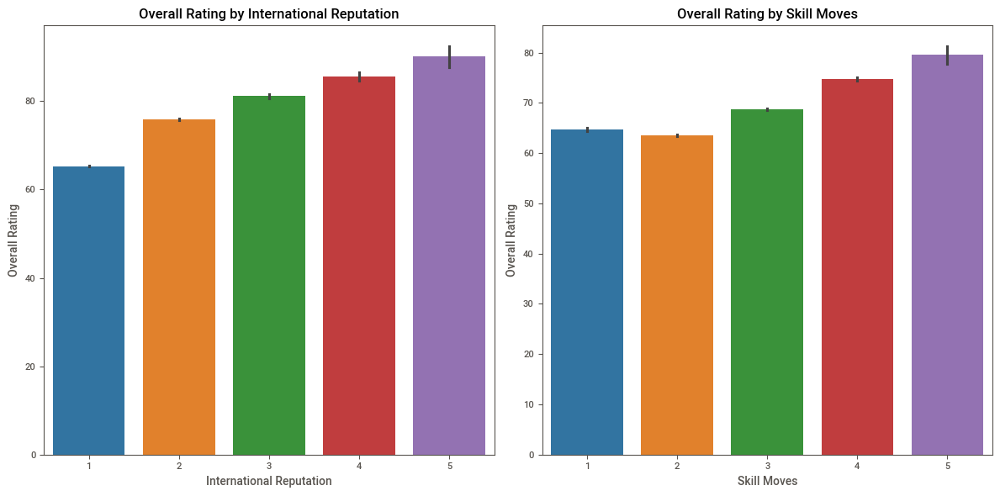

In [33]:
custom_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']  # Customize as needed

plt.figure(figsize=(12, 6))  
plt.subplot(1, 2, 1)
sns.barplot(data=data, x='international_reputation', y='overall', palette=custom_palette)
plt.title('Overall Rating by International Reputation')
plt.xlabel('International Reputation')
plt.ylabel('Overall Rating')

plt.subplot(1, 2, 2)
sns.barplot(data=data, x='skill_moves', y='overall', palette=custom_palette)
plt.title('Overall Rating by Skill Moves')
plt.xlabel('Skill Moves')
plt.ylabel('Overall Rating')
plt.tight_layout()
plt.show()

Insights:
    1 Player with high skill have high overall rating.
    2 Players with higher international reputations tend to have significantly higher overall ratings.

In [34]:


# Define positions of interest
positions_of_interest = ['ST', 'RW', 'LW']

# Filter the dataset to include only the relevant positions
df_filtered = data[data['player_positions'].str.contains('|'.join(positions_of_interest))]

# Map position abbreviations to more readable labels
position_mapping = {'ST': 'Striker', 'RW': 'Right-Winger', 'LW': 'Left-Winger'}
df_filtered['player_positions'] = df_filtered['player_positions'].map(position_mapping)

# Create a box plot to show the distribution of salaries by position
fig = px.box(df_filtered, x='player_positions', y='wage_eur',
             title='Salary Distribution by Offensive Position',
             labels={'player_positions': 'Offensive Position', 'wage_eur': 'Salary'},
             color='player_positions')



# Show the figure
fig.show()


Insights :
    1 Striker gets more paid as compared to Left-winger and Right-winger.

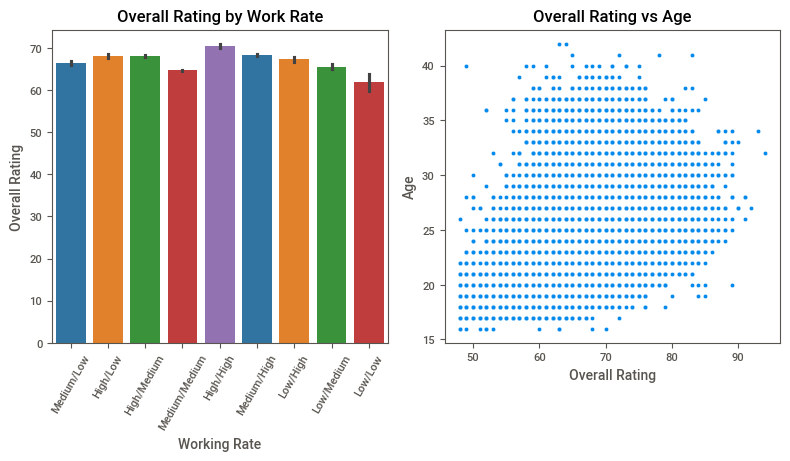

In [35]:
custom_palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']  # Customize as needed

plt.figure(figsize=(8, 8))  
plt.subplot(2, 2, 1)
sns.barplot(data=data, x='work_rate', y='overall', palette=custom_palette)
plt.title('Overall Rating by Work Rate')
plt.xticks(rotation=60)
plt.xlabel('Working Rate')
plt.ylabel('Overall Rating')

plt.subplot(2, 2, 2)
sns.scatterplot(data=data, y='age', x='overall', palette=custom_palette)
plt.title('Overall Rating vs Age')

plt.ylabel('Age')
plt.xlabel('Overall Rating')
plt.tight_layout()
plt.show()

Insights:
1 Players exhibiting 'High' work rates in offense, defense, or both generally achieve higher overall ratings.
2 Overall ratings typically peak for players aged between 25 and 30, suggesting these are prime years for player performance.
3 Both younger players (under 20) and older players (over 35) tend to have lower overall ratings.

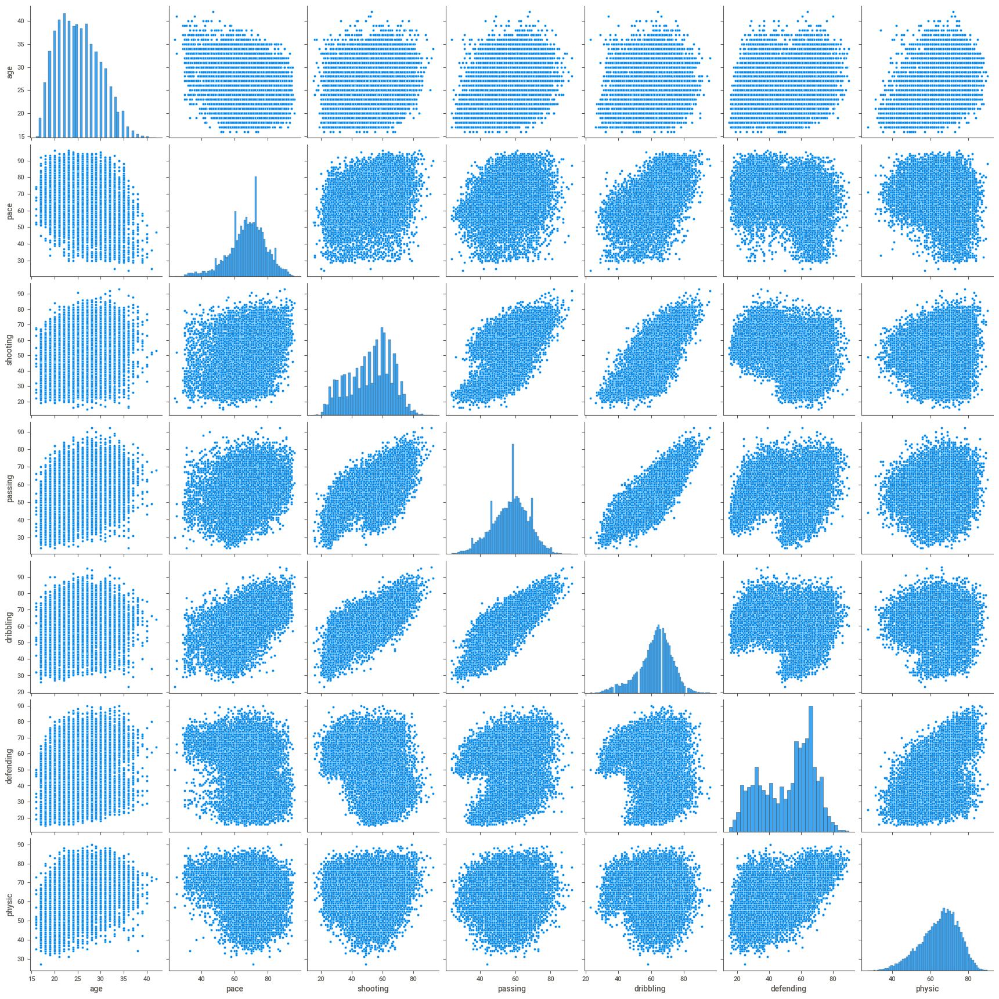

In [36]:
sns.pairplot(data[['age','pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic']])
plt.show()

Insights: 
Players who are skilled in dribbling often also have strong shooting abilities.,There is a positive relationship between passing and shooting.Dribbling and passing also exhibit a positive correlation.

# Data Preprocessing

In [37]:
data.sample(2)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
12436,236244,https://sofifa.com/player/236244/toby-sibbick/...,T. Sibbick,Toby Sibbick,20,1999-05-23,183,69,England,Barnsley,63,72,525000,2000,"RB, RWB, CB",Right,1,3,2,Medium/Medium,Lean,No,1100000.0,NaN,RB,21.0,NaN,2019-07-02,2023.0,NaN,NaN,75.0,29.0,49.0,56.0,59.0,64.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53,24,58,59,27,54,25,23,54,58,73,76,60,57,56,38,70,71,67,24,48,55,53,35,34,45,56,65,63,13,6,12,9,12,49,49,49,52,50,50,50,52,50,50,50,55,52,52,52,55,60,57,57,57,60,61,59,59,59,61
14557,200485,https://sofifa.com/player/200485/jermaine-mcgl...,J. McGlashan,Jermaine McGlashan,31,1988-04-14,170,60,England,Swindon Town,61,61,220000,3000,RM,Right,1,3,3,Medium/Medium,Lean,No,385000.0,NaN,SUB,15.0,NaN,2018-07-04,2020.0,NaN,NaN,81.0,50.0,53.0,64.0,32.0,45.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55,53,28,56,47,61,43,45,51,59,83,80,84,55,84,55,72,68,31,39,42,40,52,52,46,50,29,31,32,9,8,9,15,10,52,52,52,59,57,57,57,59,57,57,57,59,53,53,53,59,51,45,45,45,51,48,38,38,38,48


In [39]:
pd.set_option('display.max_rows',None)
data.isnull().sum()


sofifa_id                         0
player_url                        0
short_name                        0
long_name                         0
age                               0
dob                               0
height_cm                         0
weight_kg                         0
nationality                       0
club                              0
overall                           0
potential                         0
value_eur                         0
wage_eur                          0
player_positions                  0
preferred_foot                    0
international_reputation          0
weak_foot                         0
skill_moves                       0
work_rate                         0
body_type                         0
real_face                         0
release_clause_eur             1298
player_tags                   16779
team_position                   240
team_jersey_number              240
loaned_from                   17230
joined                      

In [40]:
# Create function to check missing value with percentage
def missing_value(data):
    null_value = data.isnull().sum()
    percentage = (data.isnull().sum()/data.isnull().count()*100)
    null_value = pd.concat([null_value,percentage],axis=1,keys=['Missing Number','Missing Percentage'])
    return null_value
missing_value(data)

,Missing Number,Missing Percentage
sofifa_id,0,0.000000
player_url,0,0.000000
short_name,0,0.000000
long_name,0,0.000000
age,0,0.000000
dob,0,0.000000
height_cm,0,0.000000
weight_kg,0,0.000000
nationality,0,0.000000
club,0,0.000000


Insights:
    11 Features has more than 50% to 90% missing value and some unique feature also contain missing value so we drop this feature.
Remaining feature missing value is less than 15% so we impute the missing value.

# IMPUTE MISSING VALUE
CHECKING THE DISTRIBUTION BEFORE IMPUTE MISSING VALUE
1.NUMERICAL

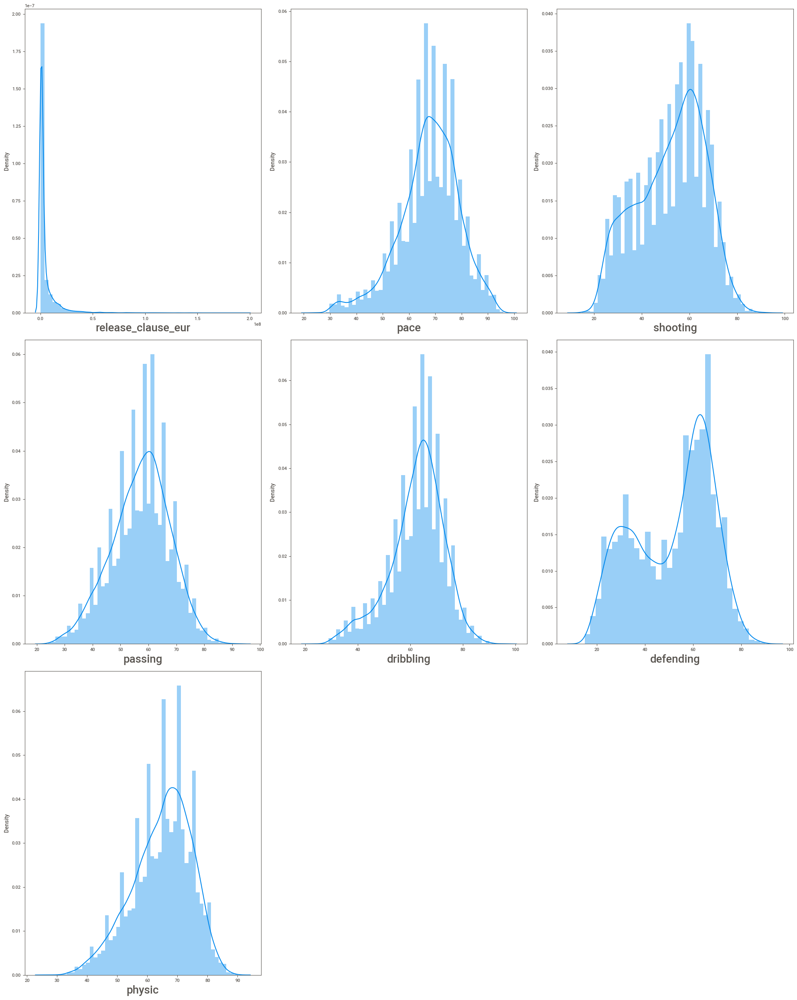

In [41]:
dist = data[['release_clause_eur','pace','shooting','passing','dribbling','defending','physic']]

plt.figure(figsize=(20,25)) # defining canvas size
plotno = 1 # counter

for column in dist: # iteration of columns / acessing the columns from  dataset 
    if plotno<=8:    # set the limit
        plt.subplot(3,3,plotno) # # plotting 36 graphs (9-rows,4-columns) ,plotnumber is for count
        sns.distplot(x=dist[column]) # Plotting dist plots 
        plt.xlabel(column,fontsize=20)  # assigning name to x-axis and font size is 20
    plotno+=1 # counter increment
plt.tight_layout()
plt.show() # used to hide the storage loction


In [42]:
# Impute missing value using median because distribution is not normal
data.loc[data['release_clause_eur'].isnull()==True,'release_clause_eur']=data['release_clause_eur'].median()
data.loc[data['pace'].isnull()==True,'pace']=data['pace'].median()
data.loc[data['shooting'].isnull()==True,'shooting']=data['shooting'].median()
data.loc[data['passing'].isnull()==True,'passing']=data['passing'].median()
data.loc[data['dribbling'].isnull()==True,'dribbling']=data['dribbling'].median()
data.loc[data['defending'].isnull()==True,'defending']=data['defending'].median()
data.loc[data['physic'].isnull()==True,'physic']=data['physic'].median()


In [43]:
# Check missing value after imputation
print('release_clause_eur:',data['release_clause_eur'].isnull().sum())
print('pace:',data['pace'].isnull().sum())
print('shooting:',data['shooting'].isnull().sum())
print('passing:',data['passing'].isnull().sum())
print('dribbling:',data['dribbling'].isnull().sum())
print('defending:',data['defending'].isnull().sum())
print('physic:',data['physic'].isnull().sum())

release_clause_eur: 0
pace: 0
shooting: 0
passing: 0
dribbling: 0
defending: 0
physic: 0


# 2.CATEGORICAL

In [44]:
data.team_position.value_counts().head()

team_position
SUB    7820
RES    2958
GK      662
RCB     660
LCB     660
Name: count, dtype: int64

In [45]:
# Impute categorical data using mode(most freqent)
data['team_position'] = data['team_position'].replace(np.nan,'SUB')

In [46]:
data['team_position'].isnull().sum()

0

In [47]:
data.preferred_foot.value_counts()

preferred_foot
Right    13960
Left      4318
Name: count, dtype: int64

In [48]:
# right = 1 
# left= 0 
data.preferred_foot = data.preferred_foot.map({'Right':1,'Left':0})

In [49]:
data.team_position.value_counts()

team_position
SUB    8060
RES    2958
GK      662
RCB     660
LCB     660
RB      560
LB      560
ST      458
RCM     411
LCM     411
RM      399
LM      398
CAM     311
RDM     244
LDM     242
RS      195
LS      195
CDM     181
LW      162
RW      161
CB      100
CM       76
RWB      58
LWB      58
RAM      23
LAM      23
RF       19
LF       19
CF       14
Name: count, dtype: int64

In [50]:
# Use mannual encoding because lots of labels avialble
data.team_position = data.team_position.map({'SUB':28,'RES':27,'GK':26,'RCB':25,'LCB':24,'RB':23,'LB':22,'ST':21,
                                            'RCM':20,'LCM':19,'RM':18,'LM':17,'CAM':16,'RDM':15,'LDM':14,'RS':13,
                                            'LS':12,'CDM':11,'LW':10,'RW':9,'CB':8,'CM':7,'RWB':6,'LWB':5,'RAM':4,
                                            'LAM':3,'RF':2,'LF':1,'CF':0})

# OUTLIER HANDLING

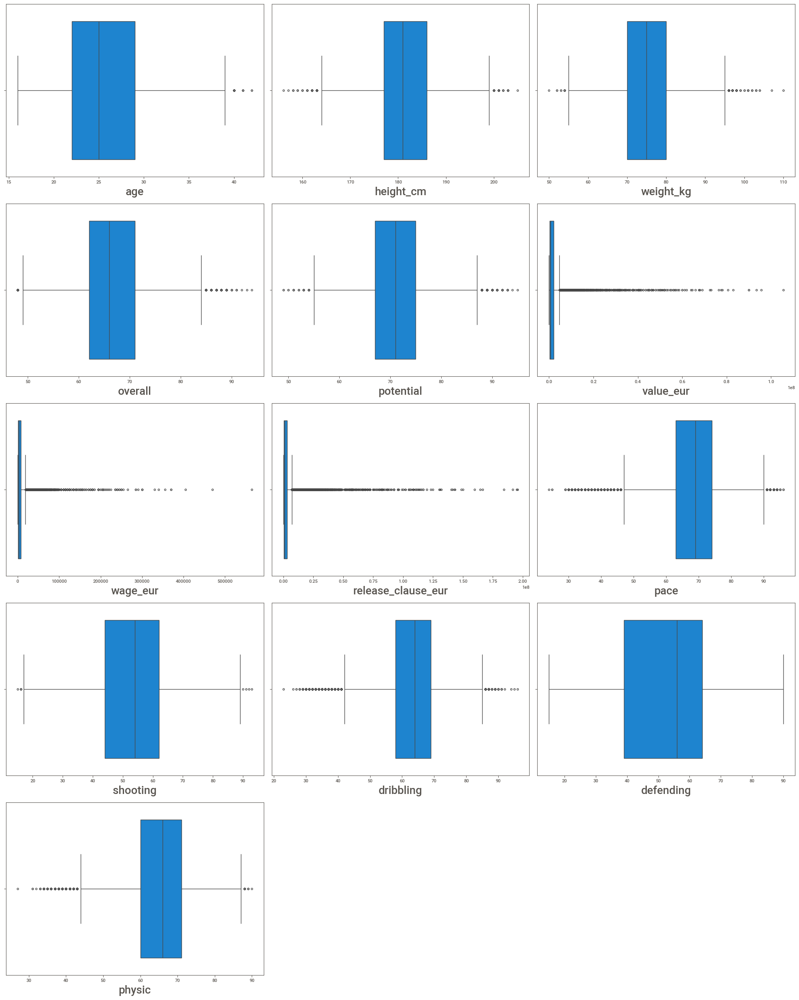

In [51]:
out = data[['age','height_cm','weight_kg','overall','potential','value_eur','wage_eur','release_clause_eur','pace',
           'shooting','dribbling','defending','physic']]

plt.figure(figsize=(20,25)) 
plotno = 1 

for column in out: 
    if plotno<=16:  
        plt.subplot(5,3,plotno) 
        sns.boxplot(x=out[column]) 
        plt.xlabel(column,fontsize=20) 
    plotno+=1 
plt.tight_layout()
plt.show()



# CHECKING THE DISTRIBUTION BEFORE HANDLE THE OUTLIER

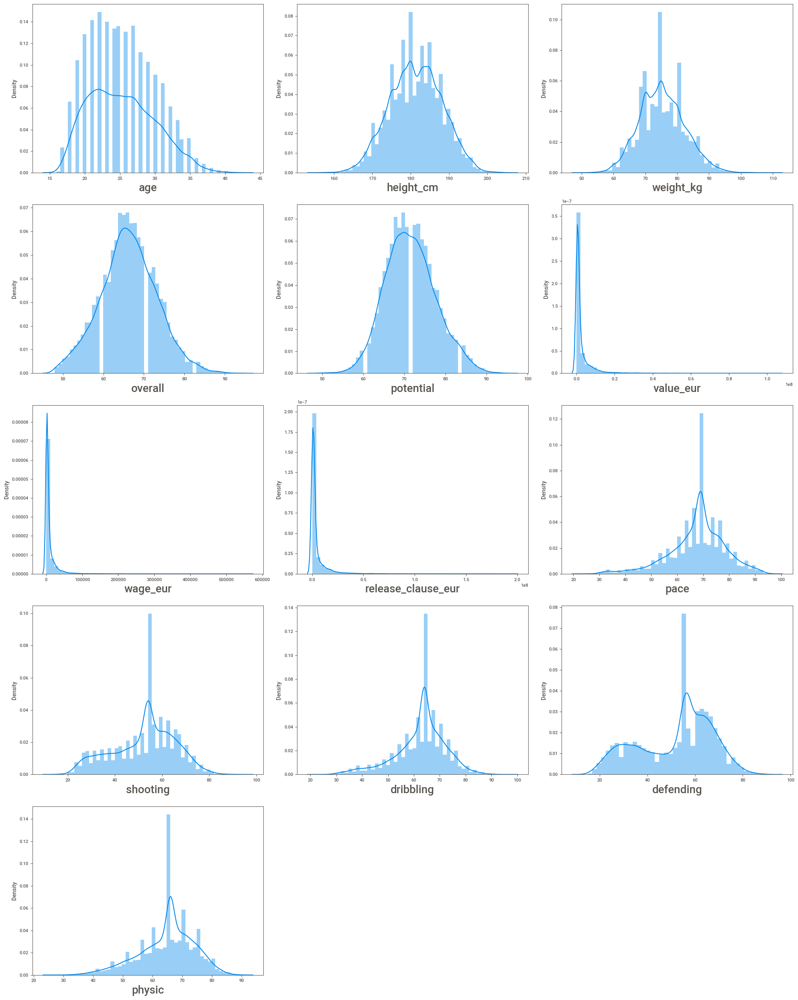

In [52]:
dist1 = data[['age','height_cm','weight_kg','overall','potential','value_eur','wage_eur','release_clause_eur','pace',
           'shooting','dribbling','defending','physic']]

plt.figure(figsize=(20,25)) # defining canvas size
plotno = 1 # counter

for column in dist1: # iteration of columns / acessing the columns from  dataset 
    if plotno<=15:    # set the limit
        plt.subplot(5,3,plotno) # # plotting 36 graphs (9-rows,4-columns) ,plotnumber is for count
        sns.distplot(x=out[column]) # Plotting box plots 
        plt.xlabel(column,fontsize=20)  # assigning name to x-axis and font size is 20
    plotno+=1 # counter increment
plt.tight_layout()
plt.show() # used to hide the storage loction



# EMPHERICAL RULE OR 3 STANDARD DEVIATION RULE TO DETECT THE OUTLIER

1. Age

In [53]:
upper_limit = data.age.mean() + 3*data.age.std()
print("Upper limit:",upper_limit)
lower_limit = data.age.mean() - 3*data.age.std()
print("Lower limit:",lower_limit)

Upper limit: 39.254184882020766
Lower limit: 11.312397895088328


In [54]:
len(data.loc[data['age'] > upper_limit])/18278*100

0.10395010395010396

In [55]:
data.loc[data['age'] > upper_limit,'age']=data['age'].mean()

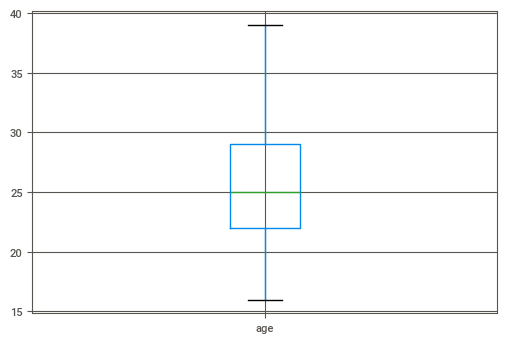

In [56]:
data.boxplot('age')
plt.show()

2. Height

In [57]:
upper_limit = data.height_cm.mean() + 3*data.height_cm.std()
print("Upper limit:",upper_limit)
lower_limit = data.height_cm.mean() - 3*data.height_cm.std()
print("Lower limit:",lower_limit)

Upper limit: 201.63306813749588
Lower limit: 161.09129995529324


In [58]:
len(data.loc[data['height_cm'] > upper_limit])/18278*100

0.06018163912900754

In [59]:
# impute outlier both lower and upper side
data.loc[data['height_cm'] <  lower_limit,'height_cm'] = data['height_cm'].mean()
data.loc[data['height_cm'] > upper_limit,'height_cm'] = data['height_cm'].mean()

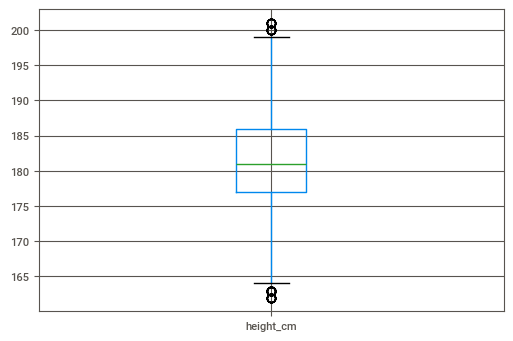

In [60]:
data.boxplot('height_cm')
plt.show()

3.WEIGHT 

In [61]:
upper_limit = data.weight_kg.mean() + 3*data.weight_kg.std()
print("Upper limit:",upper_limit)
lower_limit = data.weight_kg.mean() - 3*data.weight_kg.std()
print("Lower limit:",lower_limit)

Upper limit: 96.4195738558301
Lower limit: 54.133112433698294


In [62]:
len(data.loc[data['weight_kg'] < lower_limit])/18278*100

0.06018163912900754

In [63]:
len(data.loc[data['weight_kg'] > upper_limit])/18278*100

0.22431338220811906

In [64]:
# impute outlier 
data.loc[data['weight_kg'] < lower_limit,'weight_kg']=data['weight_kg'].mean()
data.loc[data['weight_kg'] > upper_limit,'weight_kg']=data['weight_kg'].mean()

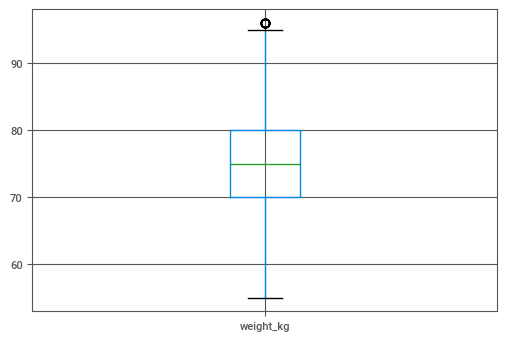

In [65]:
data.boxplot('weight_kg')
plt.show()

4.OVERALL

In [66]:
upper_limit = data.overall.mean() + 3*data.overall.std()
print("Upper limit:",upper_limit)
lower_limit = data.overall.mean() - 3*data.overall.std()
print("Lower limit:",lower_limit)

Upper limit: 87.09485374672596
Lower limit: 45.39513421694621


In [67]:
data.loc[data['overall'] < lower_limit]
# no outlier in lower limit

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb


In [68]:
# Get the percentage of outlier
len(data.loc[data['overall'] > upper_limit])/18278*100

0.218842324105482

In [69]:
data.loc[data['overall'] > upper_limit, 'overall'] = data['overall'].mean()

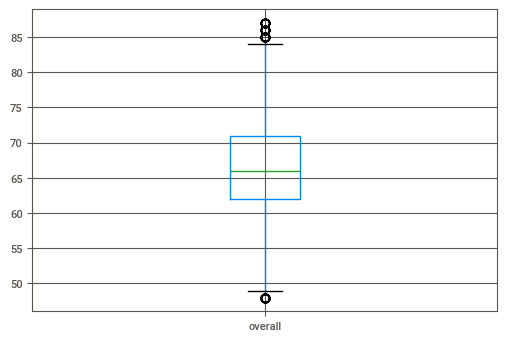

In [70]:
data.boxplot('overall')
plt.show()

5.POTENTIA

In [71]:
upper_limit = data.potential.mean() + 3*data.potential.std()
print("Upper limit:",upper_limit)
lower_limit = data.potential.mean() - 3*data.potential.std()
print("Lower limit:",lower_limit)

Upper limit: 89.96589419280832
Lower limit: 53.12787974307087


In [72]:
# Lower limit
len(data.loc[data['potential'] < lower_limit])/18278*100

0.09300798774482985

In [73]:
# upperlimit
len(data.loc[data['potential'] > upper_limit])/18278*100

0.21337126600284498

In [74]:
# impute outlier
data.loc[data['potential'] < lower_limit,'potential']=data['potential'].mean()
data.loc[data['potential'] > upper_limit,'potential']=data['potential'].mean()

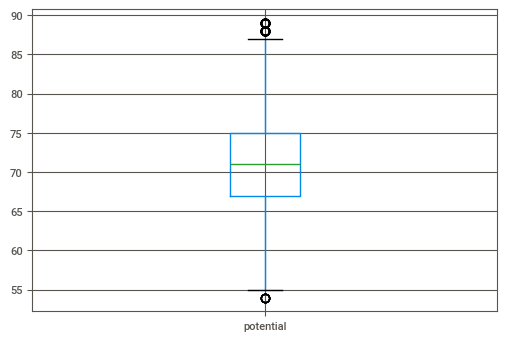

In [75]:
data.boxplot('potential')
plt.show()

# IQR

1. VALUE EUR

In [76]:
# Use iqr because of some right skewed in data

# Step:1 
from scipy import stats
iqr = stats.iqr(data['value_eur'],interpolation='midpoint')
print("IQR",iqr)

# step:2
Q1 = data['value_eur'].quantile(0.25)  # first quantile
Q3 = data['value_eur'].quantile(0.75)  #third quantile
# getting max & min limit
min_limit = Q1 - 1.5*iqr
print('minimum limit',min_limit)
max_limit = Q3 + 1.5*iqr
print('maximum limit',max_limit)


IQR 1775000.0
minimum limit -2337500.0
maximum limit 4762500.0


In [77]:
# get the percentage
len(data.loc[data['value_eur'] > max_limit])/18278*100

13.737826895721634


2.WAGE EUR

In [78]:
# Use iqr because of some right skewed in data

# Step:1 
from scipy import stats
iqr = stats.iqr(data['wage_eur'],interpolation='midpoint')
print("IQR",iqr)

# step:2
Q1 = data['wage_eur'].quantile(0.25)  # first quantile
Q3 = data['wage_eur'].quantile(0.75)  #third quantile
# getting max & min limit
min_limit = Q1 - 1.5*iqr
print('minimum limit',min_limit)

max_limit = Q3 + 1.5*iqr
print('maximum limit',max_limit)


IQR 7000.0
minimum limit -9500.0
maximum limit 18500.0


In [79]:
len(data.loc[data['wage_eur'] > max_limit])/18278*100

12.911697122223437


3.RELEASE CLASUSE EUR

In [80]:
# Use iqr because of some right skewed in data

# Step:1 
from scipy import stats
iqr = stats.iqr(data['release_clause_eur'],interpolation='midpoint')
print("IQR",iqr)

# step:2
Q1 = data['release_clause_eur'].quantile(0.25)  # first quantile
Q3 = data['release_clause_eur'].quantile(0.75)  #third quantile
# getting max & min limit
min_limit = Q1 - 1.5*iqr
print('minimum limit',min_limit)
max_limit = Q3 + 1.5*iqr
print('maximum limit',max_limit)


IQR 2604000.0
minimum limit -3310000.0
maximum limit 7106000.0


In [81]:
len(data.loc[data['release_clause_eur'] > max_limit])/18278*100

15.368202210307475


4.PACE

In [82]:
# Use iqr because of some left skewed in data

# Step:1 
from scipy import stats
iqr = stats.iqr(data['pace'],interpolation='midpoint')
print("IQR",iqr)

# step:2
Q1 = data['pace'].quantile(0.25)  # first quantile
Q3 = data['pace'].quantile(0.75)  #third quantile
# getting max & min limit
min_limit = Q1 - 1.5*iqr
print('minimum limit',min_limit)
max_limit = Q3 + 1.5*iqr
print('maximum limit',max_limit)


IQR 11.0
minimum limit 46.5
maximum limit 90.5


In [83]:
# min limit
len(data.loc[data['pace'] < min_limit])/18278*100

4.19083050661998

In [84]:
# max limit
len(data.loc[data['pace'] > max_limit])/18278*100

1.0285589232957655

In [85]:
# impute outlier both side
data.loc[data['pace'] < min_limit,'pace'] = data['pace'].median()
data.loc[data['pace'] > max_limit,'pace'] = data['pace'].median()

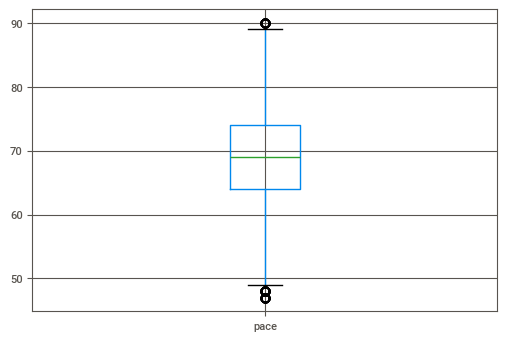

In [86]:
data.boxplot('pace')
plt.show()

5 shooting

In [87]:
# Use iqr because of some left skewed in data

# Step:1 
from scipy import stats
iqr = stats.iqr(data['shooting'],interpolation='midpoint')
print("IQR",iqr)

# step:2
Q1 = data['shooting'].quantile(0.25)  # first quantile
Q3 = data['shooting'].quantile(0.75)  #third quantile
# getting max & min limit
min_limit = Q1 - 1.5*iqr
print('minimum limit',min_limit)
max_limit = Q3 + 1.5*iqr
print('maximum limit',max_limit)


IQR 18.0
minimum limit 17.0
maximum limit 89.0


In [88]:
# min limit percentage
len(data.loc[data['shooting'] < min_limit])/18278*100

0.02735529051318525

In [89]:
# max limit percentage
len(data.loc[data['shooting'] > max_limit])/18278*100

0.0218842324105482

In [90]:
# impute the outlier
data.loc[data['shooting'] < min_limit,'shooting'] = data['shooting'].median()
data.loc[data['shooting'] > max_limit,'shooting'] = data['shooting'].median()

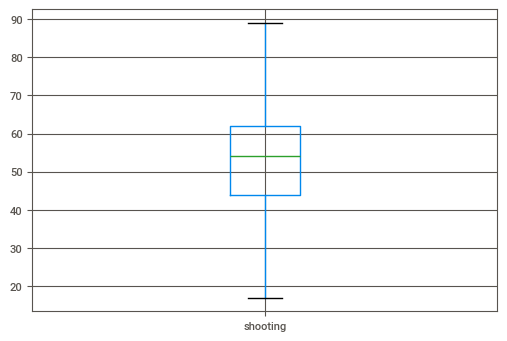

In [91]:
data.boxplot('shooting')
plt.show()


6. DRIBBLING

In [92]:
# Use iqr because of some left skewed in data

# Step:1 
from scipy import stats
iqr = stats.iqr(data['dribbling'],interpolation='midpoint')
print("IQR",iqr)

# step:2
Q1 = data['dribbling'].quantile(0.25)  # first quantile
Q3 = data['dribbling'].quantile(0.75)  #third quantile
# getting max & min limit
min_limit = Q1 - 1.5*iqr
print('minimum limit',min_limit)
max_limit = Q3 + 1.5*iqr
print('maximum limit',max_limit)


IQR 11.0
minimum limit 41.5
maximum limit 85.5


In [93]:
# min limit percentage
len(data.loc[data['shooting'] < min_limit])/18278*100

21.80763759711128

In [94]:
# max limit percentage
len(data.loc[data['shooting'] > max_limit])/18278*100

0.0656526972316446

In [95]:
# impute outlier
data.loc[data['dribbling'] > max_limit,'dribbling']=data['dribbling'].median()

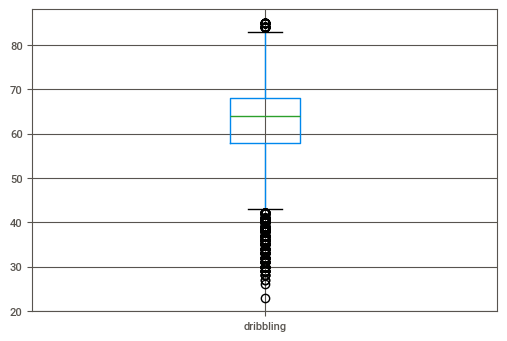

In [96]:
data.boxplot('dribbling')
plt.show()


7.PHYSIC

In [97]:
# Use iqr because of some left skewed in data

# Step:1 
from scipy import stats
iqr = stats.iqr(data['physic'],interpolation='midpoint')
print("IQR",iqr)

# step:2
Q1 = data['physic'].quantile(0.25)  # first quantile
Q3 = data['physic'].quantile(0.75)  #third quantile
# getting max & min limit
min_limit = Q1 - 1.5*iqr
print('minimum limit',min_limit)
max_limit = Q3 + 1.5*iqr
print('maximum limit',max_limit)


IQR 11.0
minimum limit 43.5
maximum limit 87.5


In [98]:
# min limit percentage
len(data.loc[data['physic'] < min_limit])/18278*100

2.303315461210198

In [99]:
# max limit percentage
len(data.loc[data['physic'] > max_limit])/18278*100

0.0656526972316446

In [100]:
# impute outlier
data.loc[data['physic'] < min_limit,'physic']=data['physic'].median()
data.loc[data['physic'] > max_limit,'physic']=data['physic'].median()

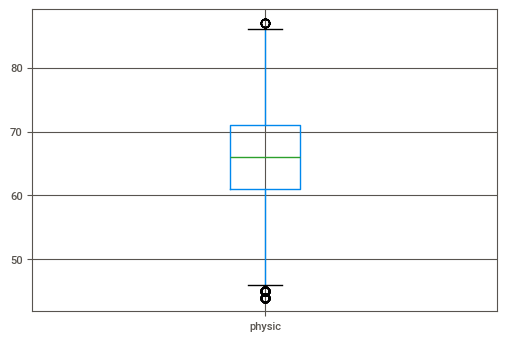

In [101]:
data.boxplot('physic')
plt.show()

Insights:
    1 in age : outlier is successfullt imputed.
    2 in Hight_cm : Outlier is impute but box plot are show outlier.
    3 in WEIGHT KG : Outlier is removed successfully.
    4 in VALUE EUR : outlier is more than 5% so we not impute the outlier.
    5 in WAGE EUR,.RELEASE CLASUSE EUR :  outlier is more than 5% so we dont impute the outlier.
    6 in PACE : Outlier is impute successfully, but box plot is show outlier.
    7 in DRIBBLING : the minimum limit percentage is 15  percent so we dont impute the outlier.
    8 in PHYSIC :Outlier is impute successfully.

# CHECKING DISTRIBUTION AFTER IMPUTE OUTLIER

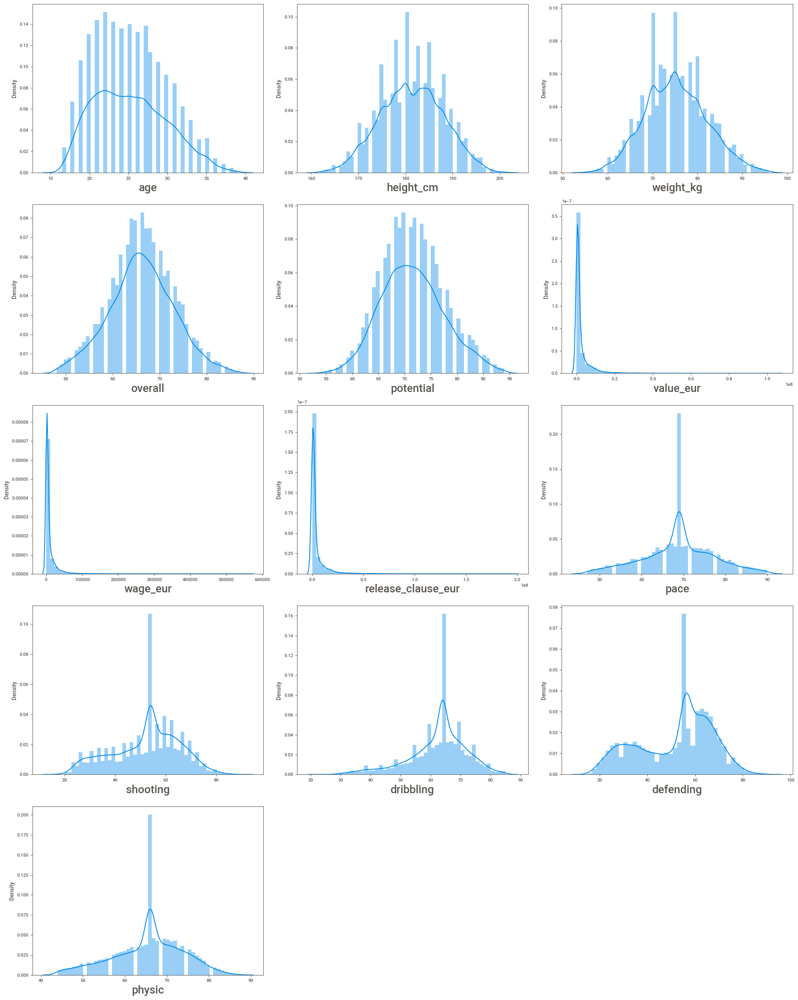

In [102]:
dist2 = data[['age','height_cm','weight_kg','overall','potential','value_eur','wage_eur','release_clause_eur','pace',
           'shooting','dribbling','defending','physic']]

plt.figure(figsize=(20,25)) # defining canvas size
plotno = 1 # counter

for column in dist2: # iteration of columns / acessing the columns from  dataset 
    if plotno<=15:    # set the limit
        plt.subplot(5,3,plotno) # # plotting 13 graphs (5-rows,3-columns) ,plotnumber is for count
        sns.distplot(x=dist2[column]) # Plotting box plots 
        plt.xlabel(column,fontsize=20)  # assigning name to x-axis and font size is 20
    plotno+=1 # counter increment
plt.tight_layout()
plt.show() # used to hide the storage loction



# Feature Scaling

# MIN-MAX SCALING


In [103]:
# Scale only continous feature in nature
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() # Object Creation
data[['age','height_cm','weight_kg','overall','potential','value_eur','wage_eur','release_clause_eur',
    'pace','shooting','passing','dribbling','defending','physic','attacking_crossing','attacking_crossing',
    'attacking_finishing','attacking_heading_accuracy','attacking_short_passing','attacking_volleys',
    'skill_dribbling','skill_curve','skill_fk_accuracy','skill_fk_accuracy','skill_long_passing',
    'skill_ball_control','skill_ball_control','movement_acceleration','movement_sprint_speed',
    'movement_agility','movement_reactions','movement_balance','power_shot_power','power_jumping',
    'power_stamina','power_strength','power_long_shots','mentality_aggression','mentality_interceptions',
    'mentality_positioning','mentality_vision','mentality_penalties','mentality_composure','defending_marking',
    'defending_standing_tackle','defending_sliding_tackle','goalkeeping_diving','goalkeeping_handling',
    'goalkeeping_kicking','goalkeeping_positioning',
    'goalkeeping_reflexes']]=scaler.fit_transform(data[['age','height_cm','weight_kg','overall','potential',
                'value_eur','wage_eur','release_clause_eur','pace','shooting','passing','dribbling','defending',
                'physic','attacking_crossing','attacking_crossing','attacking_finishing','attacking_heading_accuracy',
                'attacking_short_passing','attacking_volleys','skill_dribbling','skill_curve','skill_fk_accuracy',
                'skill_fk_accuracy','skill_long_passing','skill_ball_control','skill_ball_control','movement_acceleration',
                'movement_sprint_speed','movement_agility','movement_reactions','movement_balance',
                'power_shot_power','power_jumping','power_stamina','power_strength','power_long_shots','mentality_aggression',
                'mentality_interceptions','mentality_positioning','mentality_vision','mentality_penalties',
                'mentality_composure','defending_marking','defending_standing_tackle','defending_sliding_tackle',
                'goalkeeping_diving','goalkeeping_handling','goalkeeping_kicking','goalkeeping_positioning','goalkeeping_reflexes']])

In [104]:
data.head(3)


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,0.695652,1987-06-24,0.205128,0.414634,Argentina,FC Barcelona,0.46782,0.501872,0.905213,1.000000,"RW, CF, ST",0,5,4,4,Medium/Low,Messi,Yes,1.000000,"Dribbler, Distance Shooter, Crosser, FK Specia...",9,10.0,NaN,2004-07-01,2021.0,NaN,NaN,0.930233,0.513889,1.000000,0.66129,0.320000,0.511628,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",0.943182,1.000000,0.738636,1.000000,0.977011,1.000000,0.988636,1.000000,1.000000,1.000000,0.929412,0.858824,0.964706,0.986667,0.976471,0.888889,0.644737,0.741176,0.623377,1.000000,0.453488,0.415730,0.989247,1.000000,0.800000,1.000000,0.344086,0.367816,0.264368,0.056180,0.109890,0.152174,0.144444,0.076923,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,0.782609,1985-02-05,0.641026,0.682927,Portugal,Juventus,0.46782,0.501872,0.554502,0.716814,"ST, LW",1,5,4,5,High/Low,C. Ronaldo,Yes,0.492816,"Speedster, Dribbler, Distance Shooter, Acrobat...",10,7.0,NaN,2018-07-10,2022.0,LS,7.0,1.000000,0.513889,0.852941,0.66129,0.266667,0.790698,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",0.897727,0.989247,0.954545,0.894118,0.965517,0.913978,0.852273,0.800000,0.821429,0.956044,0.905882,0.941176,0.894118,1.000000,0.694118,1.000000,1.000000,0.858824,0.753247,0.988889,0.627907,0.292135,1.000000,0.858824,0.917647,0.988095,0.290323,0.310345,0.241379,0.067416,0.109890,0.152174,0.144444,0.109890,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,0.478261,1992-02-05,0.333333,0.317073,Brazil,Paris Saint-Germain,0.46782,0.501872,1.000000,0.513274,"LW, CAM",1,5,5,5,High/Medium,Neymar,Yes,0.996935,"Speedster, Dribbler, Playmaker , Crosser, FK ...",16,10.0,NaN,2017-08-03,2022.0,LW,10.0,0.511628,0.944444,0.926471,0.66129,0.226667,0.325581,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",0.931818,0.913978,0.647727,0.941176,0.965517,0.989247,0.931818,0.922222,0.869048,0.989011,0.964706,0.917647,1.000000,0.946667,0.847059,0.814815,0.552632,0.811765,0.376623,0.888889,0.488372,0.370787,0.913978,0.952941,0.976471,0.976190,0.279570,0.241379,0.298851,0.089888,0.087912,0.152174,0.155556,0.109890,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61


# Feature Selection

1.DROP UNIQUE AND CONSTANT FEATURE


Here we are going to drop unique column as well as lots of missing value column.
The column ls,st,rs,lw,cf etc.. are playing position in the game and the data in this columns is basically the potential of the player if were to play in that position, so we assume the player only playes with the team position and we will drop this column

In [105]:
# Drop column
data.drop(['sofifa_id','player_url','short_name','long_name','dob','nationality','club','player_positions','body_type',
          'real_face','player_tags','team_jersey_number','loaned_from','joined','contract_valid_until','nation_position',
          'nation_jersey_number','gk_diving','gk_handling','gk_kicking','gk_reflexes','gk_speed','gk_positioning',
          'player_traits','ls','st','rs','lw','cf','rf','rw','lam','cam','ram','lm','lcm','cm','rcm','rm','lwb','ldm',
          'cdm','rdm','rwb','lb','lcb','cb','rcb','rb','lf','work_rate'],axis=1,inplace=True)

In [106]:
data.head(3)

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,team_position,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,0.695652,0.205128,0.414634,0.46782,0.501872,0.905213,1.000000,0,5,4,4,1.000000,9,0.930233,0.513889,1.000000,0.66129,0.320000,0.511628,0.943182,1.000000,0.738636,1.000000,0.977011,1.000000,0.988636,1.000000,1.000000,1.000000,0.929412,0.858824,0.964706,0.986667,0.976471,0.888889,0.644737,0.741176,0.623377,1.000000,0.453488,0.415730,0.989247,1.000000,0.800000,1.000000,0.344086,0.367816,0.264368,0.056180,0.109890,0.152174,0.144444,0.076923
1,0.782609,0.641026,0.682927,0.46782,0.501872,0.554502,0.716814,1,5,4,5,0.492816,10,1.000000,0.513889,0.852941,0.66129,0.266667,0.790698,0.897727,0.989247,0.954545,0.894118,0.965517,0.913978,0.852273,0.800000,0.821429,0.956044,0.905882,0.941176,0.894118,1.000000,0.694118,1.000000,1.000000,0.858824,0.753247,0.988889,0.627907,0.292135,1.000000,0.858824,0.917647,0.988095,0.290323,0.310345,0.241379,0.067416,0.109890,0.152174,0.144444,0.109890
2,0.478261,0.333333,0.317073,0.46782,0.501872,1.000000,0.513274,1,5,5,5,0.996935,16,0.511628,0.944444,0.926471,0.66129,0.226667,0.325581,0.931818,0.913978,0.647727,0.941176,0.965517,0.989247,0.931818,0.922222,0.869048,0.989011,0.964706,0.917647,1.000000,0.946667,0.847059,0.814815,0.552632,0.811765,0.376623,0.888889,0.488372,0.370787,0.913978,0.952941,0.976471,0.976190,0.279570,0.241379,0.298851,0.089888,0.087912,0.152174,0.155556,0.109890


In [107]:
data.isnull().sum()

age                           0
height_cm                     0
weight_kg                     0
overall                       0
potential                     0
value_eur                     0
wage_eur                      0
preferred_foot                0
international_reputation      0
weak_foot                     0
skill_moves                   0
release_clause_eur            0
team_position                 0
pace                          0
shooting                      0
passing                       0
dribbling                     0
defending                     0
physic                        0
attacking_crossing            0
attacking_finishing           0
attacking_heading_accuracy    0
attacking_short_passing       0
attacking_volleys             0
skill_dribbling               0
skill_curve                   0
skill_fk_accuracy             0
skill_long_passing            0
skill_ball_control            0
movement_acceleration         0
movement_sprint_speed         0
movement

2.CHECKING CORRELATION

In [108]:
data.corr()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,team_position,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
age,1.000000,0.081825,0.235507,0.465942,-0.263493,0.083345,0.152189,0.006318,0.256318,0.073591,0.048315,0.068669,-0.162284,-0.066880,0.223736,0.307117,0.152476,0.245411,0.377200,0.131539,0.081372,0.152823,0.138928,0.145669,0.020140,0.144337,0.192761,0.186275,0.091374,-0.148783,-0.139705,-0.019365,0.464196,-0.087483,0.263674,0.186651,0.121348,0.341898,0.164369,0.262180,0.198394,0.089510,0.196565,0.143095,0.370790,0.159563,0.119566,0.104168,0.107007,0.109208,0.108890,0.117237,0.108485
height_cm,0.081825,1.000000,0.758767,0.040680,-0.002573,0.010298,0.019599,0.083465,0.038448,-0.173893,-0.427502,0.011371,0.115193,-0.322364,-0.166607,-0.251701,-0.349534,0.226193,0.413394,-0.497228,-0.374449,0.011683,-0.369700,-0.349417,-0.498802,-0.446248,-0.408898,-0.333394,-0.423454,-0.556172,-0.473235,-0.630700,-0.016994,-0.787144,-0.172917,-0.037795,-0.290376,0.532801,-0.382526,-0.044891,-0.053660,-0.444022,-0.369987,-0.333836,-0.157882,-0.076986,-0.068870,-0.077490,0.366300,0.366083,0.363585,0.365901,0.366147
weight_kg,0.235507,0.758767,1.000000,0.152619,-0.015062,0.049439,0.063460,0.076584,0.089659,-0.126302,-0.347747,0.045490,0.065831,-0.271491,-0.073823,-0.157103,-0.251712,0.224703,0.488847,-0.396941,-0.288350,0.045239,-0.285850,-0.257122,-0.410895,-0.345110,-0.306789,-0.256859,-0.335107,-0.487739,-0.416660,-0.538697,0.089638,-0.662585,-0.055172,0.036255,-0.213391,0.611366,-0.275923,0.033683,-0.024554,-0.351586,-0.279621,-0.242053,-0.053074,-0.045121,-0.048723,-0.060501,0.334624,0.336503,0.333002,0.337143,0.335988
overall,0.465942,0.040680,0.152619,1.000000,0.627276,0.568768,0.496974,-0.035088,0.431482,0.227064,0.400131,0.539411,-0.272091,0.185569,0.454310,0.627560,0.536466,0.303984,0.450878,0.389289,0.340242,0.347073,0.500757,0.391496,0.370315,0.414414,0.387645,0.484578,0.455734,0.184868,0.197523,0.251562,0.853851,0.102954,0.564511,0.265549,0.370892,0.361541,0.424567,0.402270,0.318321,0.354784,0.503976,0.344874,0.713519,0.305655,0.253197,0.223361,-0.017887,-0.018431,-0.022055,-0.011307,-0.017552
potential,-0.263493,-0.002573,-0.015062,0.627276,1.000000,0.517008,0.422507,-0.030395,0.314659,0.164259,0.323413,0.500691,-0.118504,0.183262,0.273771,0.384960,0.395781,0.131182,0.135345,0.237124,0.240901,0.203867,0.359908,0.251979,0.303281,0.270360,0.219105,0.317626,0.342124,0.221738,0.219710,0.212591,0.502644,0.134097,0.343049,0.105419,0.192036,0.073816,0.260517,0.177268,0.150837,0.239552,0.340824,0.222189,0.433341,0.166858,0.144520,0.128945,-0.052728,-0.053518,-0.058755,-0.052139,-0.054157
value_eur,0.083345,0.010298,0.049439,0.568768,0.517008,1.000000,0.858052,-0.012596,0.618133,0.169084,0.303694,0.979233,-0.189112,0.140612,0.318220,0.426169,0.339167,0.145681,0.218677,0.250012,0.252399,0.192478,0.333462,0.283819,0.268482,0.285154,0.256831,0.313662,0.307797,0.162633,0.167567,0.185968,0.556465,0.113643,0.356146,0.131904,0.216242,0.143455,0.277631,0.199821,0.156585,0.256661,0.365560,0.234947,0.457112,0.154734,0.125180,0.102949,-0.022094,-0.022119,-0.023048,-0.020554,-0.021607
wage_eur,0.152189,0.019599,0.063460,0.496974,0.422507,0.858052,1.000000,-0.013084,0.652061,0.149405,0.263147,0.843946,-0

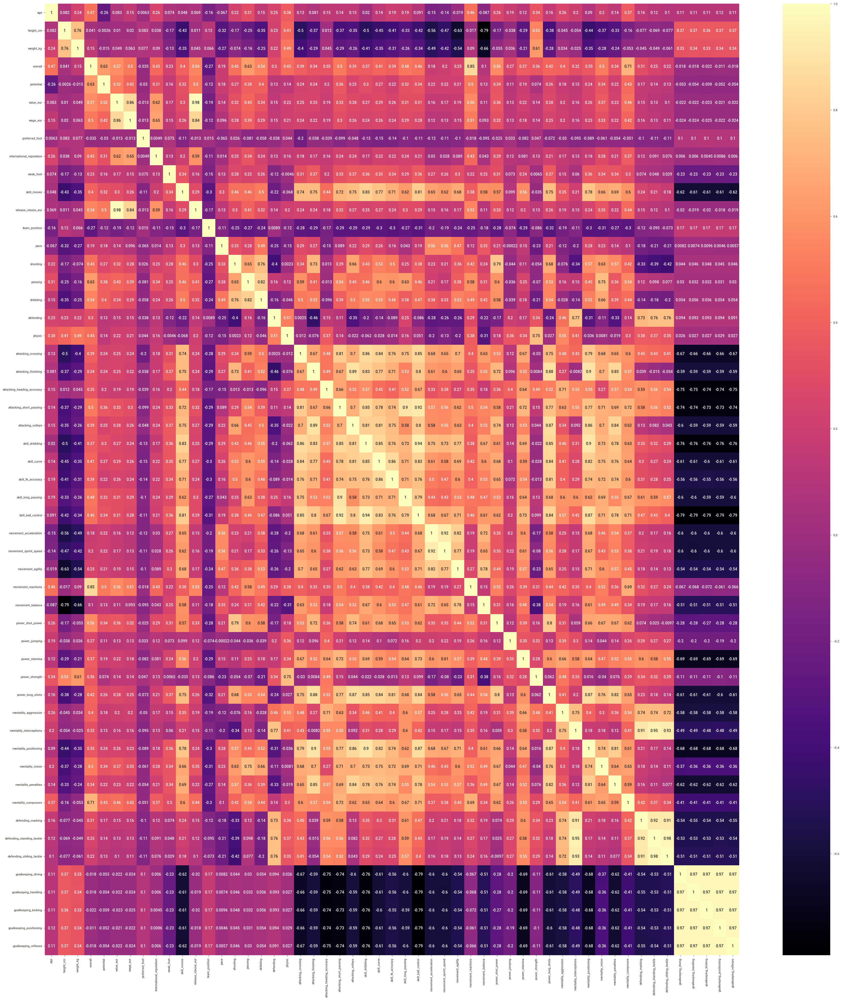

In [109]:
plt.figure(figsize=(40,45))
sns.heatmap(data.corr(),annot=True,cmap='magma')
plt.show()


Insights:
From the above heatmap is very difficult to find highly correalted feature so we are create a python code to check the highly corelated feature

In [110]:
# To get highly corelated feature 
pd.set_option('display.max_rows',None)
corrmat = data.corr()
corrmat = corrmat.abs().unstack()
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat [corrmat >= 0.9] # Set threshold 0.9
corrmat = corrmat [corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1','feature2','corr']
corrmat

,feature1,feature2,corr
0,release_clause_eur,value_eur,0.979233
1,value_eur,release_clause_eur,0.979233
2,defending_sliding_tackle,defending_standing_tackle,0.975808
3,defending_standing_tackle,defending_sliding_tackle,0.975808
4,goalkeeping_diving,goalkeeping_reflexes,0.973922
5,goalkeeping_reflexes,goalkeeping_diving,0.973922
6,goalkeeping_handling,goalkeeping_diving,0.971330
7,goalkeeping_diving,goalkeeping_handling,0.971330
8,goalkeeping_reflexes,goalkeeping_handling,0.971244
9,goalkeeping_handling,goalkeeping_reflexes,0.971244


DROP HIGHLY CORRELATED FEATURE

In [111]:
data.drop(['release_clause_eur','defending_standing_tackle','goalkeeping_diving','goalkeeping_handling',
           'goalkeeping_positioning','goalkeeping_reflexes','mentality_interceptions','skill_ball_control',
           'movement_sprint_speed','defending_marking','mentality_positioning','attacking_short_passing'],axis=1,inplace=True)

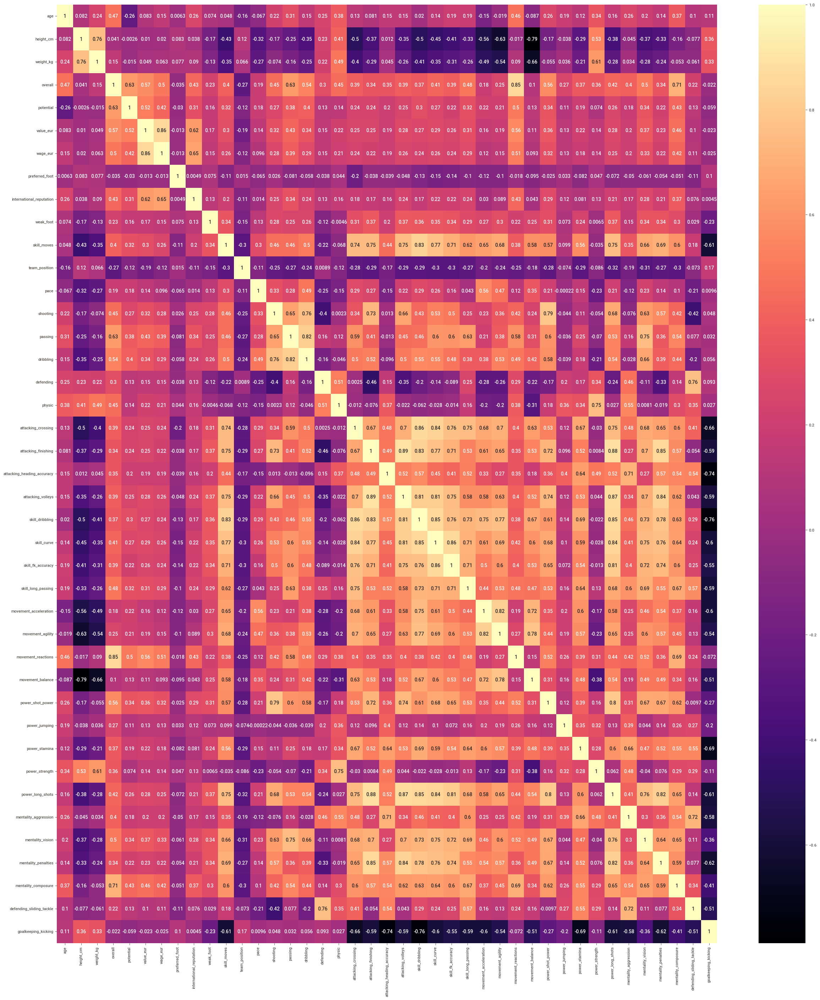

In [112]:
# Plot hitmap for after drop highly correlated feature better visualisation
plt.figure(figsize=(30,35))
sns.heatmap(data.corr(),annot=True,cmap='magma')
plt.show()

3.CHECKING DUPLICATES

In [113]:
data.duplicated().sum()

0

Insights :
    there are no duplicates found in dataset.

Encoding

# Feature Extraction
PCA

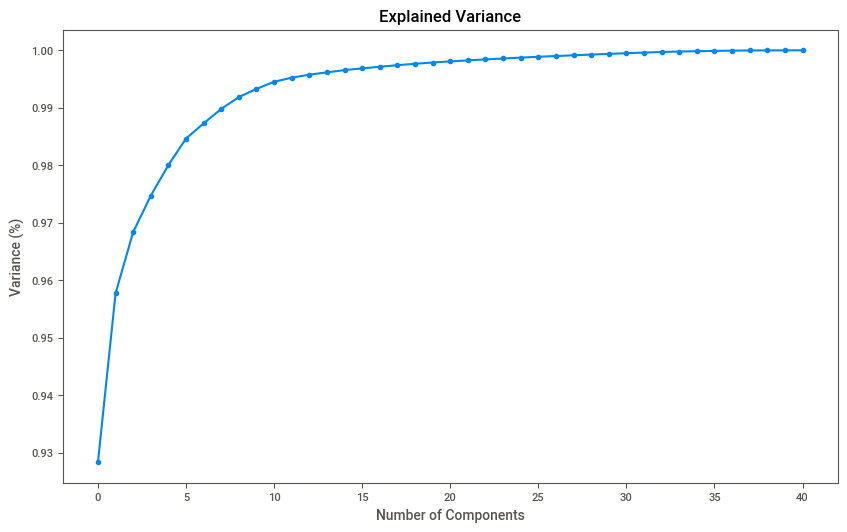

In [114]:
# Step:1 Getting optimal value of pca
from sklearn.decomposition import PCA
pca = PCA()
principalComponents = pca.fit_transform(data)
cumsum_explained_variance=np.cumsum(pca.explained_variance_ratio_)
 
plt.figure(figsize=(10, 6))
plt.plot(cumsum_explained_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)')
plt.title('Explained Variance')
plt.show()

In [115]:
pca=PCA(n_components=2)
principle_components=pca.fit_transform(data)
transformed_df=pd.DataFrame(principle_components,columns=['PC1','PC2'])
print(transformed_df.head())

         PC1       PC2
0 -15.461256  2.015093
1 -14.498249  2.574933
2  -8.528416  3.407803
3   1.789442 -1.354069
4 -14.445248  1.825999


Insights :
    Here we are select 2 components because less varaince loss

# MODEL CREATION

Create a cluster on data
Get best sillhoutte score, range of sillhoutte score between -1 to +1

# K-MEANS CLUSTERING

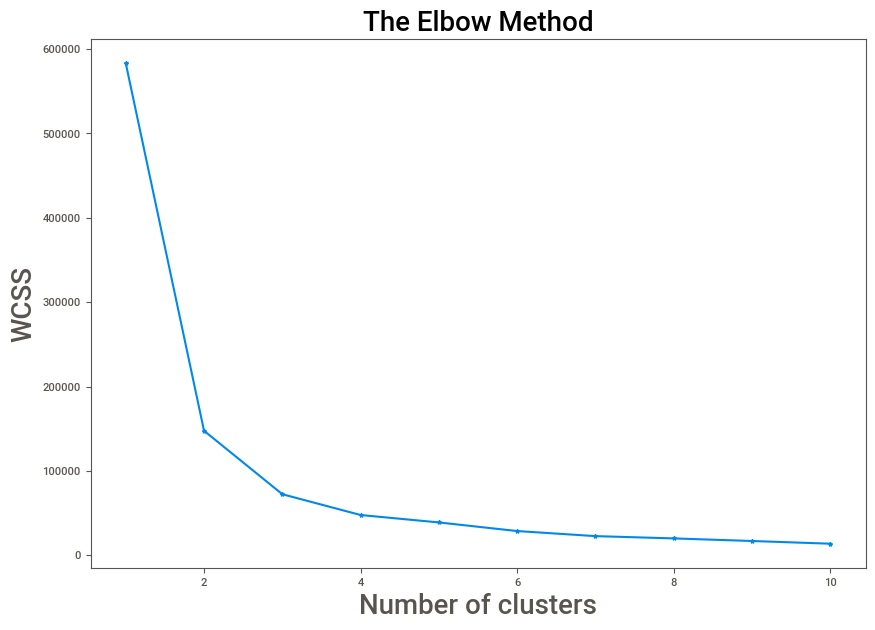

In [116]:
from sklearn.cluster import KMeans
kmeans = KMeans() # Object creation
wcss = [] # Create empty list

for i in range(1,11):
    model = KMeans(n_clusters=i,random_state=42)
    model.fit(transformed_df)
    wcss.append(model.inertia_)
plt.figure(figsize=(10,7))
plt.plot(range(1,11),wcss,marker='*')
plt.title('The Elbow Method',fontsize=20)
plt.xlabel('Number of clusters',fontsize=20)
plt.ylabel('WCSS',fontsize=20)
plt.show()

In [117]:
model1=KMeans(n_clusters=3,random_state=42)
predicted_data=model1.fit_transform(transformed_df)
labels_kmeans=model1.fit_predict(transformed_df)
predicted_data

array([[18.61083866, 11.14424234,  3.00043205],
       [17.72903007, 10.2976595 ,  2.98980482],
       [12.0724439 ,  5.09204404,  6.14386267],
       ...,
       [ 1.07808162,  8.30223204, 17.25968159],
       [ 1.03684547,  8.2906585 , 17.25402075],
       [ 0.78960318,  8.2225202 , 17.22394313]])

In [118]:

model1.labels_

array([2, 2, 1, ..., 0, 0, 0])

In [119]:
model1.cluster_centers_

array([[  3.03251217,  -0.06909933],
       [ -4.43843567,   0.37449212],
       [-13.47605982,  -0.23470459]])

# MODEL EVALUATION

SILHOUETTE SCORE
silhouette score range(-1 to +1)
+1 ---> Samles are very far from cluster
0 ---> Samples close to dicision boundry
-1 ---> Samples are assign to wrong cluster

In [120]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score


In [121]:
davies_bouldin_score(transformed_df,labels_kmeans)

0.5307785260340468

In [122]:
silhouette_score(transformed_df,labels_kmeans)

0.6770595714695082

# Hierarchical Clustering

In [123]:
from sklearn.cluster import AgglomerativeClustering
agg_clustering = AgglomerativeClustering(n_clusters=3)
predicted_data_hierachical=agg_clustering.fit(transformed_df)
labels_agg = agg_clustering.fit_predict(transformed_df)

In [124]:

labels_agg

array([0, 0, 0, ..., 2, 2, 2], dtype=int64)

In [125]:
davies_bouldin_score(transformed_df,labels_agg)

0.5833079722777573

In [126]:

silhouette_score(transformed_df,labels_agg)

0.6183447253761718

# GaussianMixture

In [127]:
from sklearn.mixture import GaussianMixture
transformed_df_scaled = scaler.fit_transform(transformed_df)
np.seterr(under='ignore')
gmm = GaussianMixture(n_components=3, random_state=42)  # Adjust n_components as needed
gmm.fit(transformed_df)
labels_gaussian = gmm.predict(transformed_df)

# Add cluster labels to the DataFrame
transformed_df['Cluster'] = labels_gaussian


In [128]:
labels_gaussian

array([2, 2, 1, ..., 0, 0, 0], dtype=int64)

In [131]:

davies_bouldin_score(transformed_df,labels_gaussian)

0.7019237679434251

In [132]:

silhouette_score(transformed_df,labels_gaussian)

0.5481674246703384

# DBSCAN Clustering

In [133]:
from sklearn.cluster import DBSCAN
# Apply DBSCAN to the PCA-transformed data
dbscan = DBSCAN(eps=0.5, min_samples=5)
labels_dbscan = dbscan.fit_predict(transformed_df)

In [134]:
labels_dbscan

array([ 0, -1, -1, ..., 14, 14, 14], dtype=int64)

In [136]:
silhouette_score(transformed_df,labels_dbscan)

0.3705902581037943

In [137]:
davies_bouldin_score(transformed_df,labels_gaussian)

0.7019237679434251

# Comparing above models

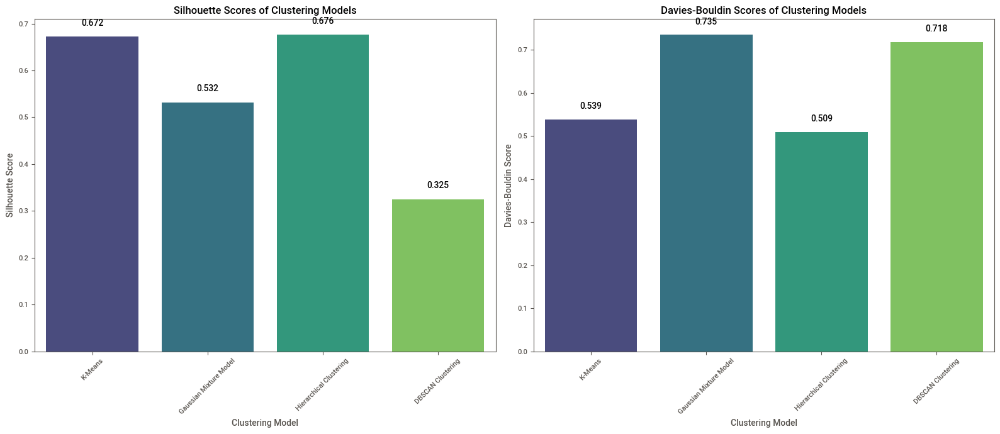

In [138]:
silhouette_scores = {
    'K-Means': 0.672,
    'Gaussian Mixture Model': 0.532,  
    'Hierarchical Clustering': 0.676,
    'DBSCAN Clustering': 0.325
}
davies_bouldin_scores = {
    'K-Means': 0.539,
    'Gaussian Mixture Model': 0.735,
    'Hierarchical Clustering': 0.509,
    'DBSCAN Clustering':0.718
}


silhouette_df = pd.DataFrame(list(silhouette_scores.items()), columns=['Model', 'Silhouette Score'])
davies_bouldin_df = pd.DataFrame(list(davies_bouldin_scores.items()), columns=['Model', 'Davies-Bouldin Score'])

# Create the plots
fig, axs = plt.subplots(1, 2, figsize=(16, 7))

# Plot Silhouette Scores
sns.barplot(x='Model', y='Silhouette Score', data=silhouette_df, palette='viridis', ax=axs[0])
axs[0].set_title('Silhouette Scores of Clustering Models')
axs[0].set_xlabel('Clustering Model')
axs[0].set_ylabel('Silhouette Score')
axs[0].tick_params(axis='x', rotation=45)

# Annotate Silhouette Scores
for i, v in enumerate(silhouette_df['Silhouette Score']):
    axs[0].text(i, v + 0.02, f"{v:.3f}", ha='center', va='bottom')

# Plot Davies-Bouldin Scores
sns.barplot(x='Model', y='Davies-Bouldin Score', data=davies_bouldin_df, palette='viridis', ax=axs[1])
axs[1].set_title('Davies-Bouldin Scores of Clustering Models')
axs[1].set_xlabel('Clustering Model')
axs[1].set_ylabel('Davies-Bouldin Score')
axs[1].tick_params(axis='x', rotation=45)

# Annotate Davies-Bouldin Scores
for i, v in enumerate(davies_bouldin_df['Davies-Bouldin Score']):
    if v is not None:  # Avoid annotating None values
        axs[1].text(i, v + 0.02, f"{v:.3f}", ha='center', va='bottom')

plt.tight_layout()
plt.show()


# Conclusion on Clustering Models Accuracy:

Based on Silhouette Scores and Davies-Bouldin Scores:

K-Means Clustering:
Silhouette Score: 0.672
Davies-Bouldin Score: 0.539
Summary: K-Means has the highest Silhouette Score, showing excellent cluster cohesion, and the lowest Davies-Bouldin Score, indicating well-separated and compact clusters. It provides robust performance overall.

Gaussian Mixture Model (GMM):
Silhouette Score: 0.532
Davies-Bouldin Score: 0.735
Summary: GMM offers good cohesion but has a higher Davies-Bouldin Score compared to K-Means, indicating less separation. It’s flexible but slightly less effective in overall cluster quality.

Hierarchical Clustering:
Silhouette Score: 0.676
Davies-Bouldin Score: 0.509
Summary: Hierarchical Clustering has the highest Silhouette Score and the lowest Davies-Bouldin Score, reflecting excellent cluster cohesion and separation. It is a strong performer in this context.

DBSCAN Clustering:
Silhouette Score: 0.325
Davies-Bouldin Score: 0.718
Summary: DBSCAN shows the lowest Silhouette Score and a higher Davies-Bouldin Score, indicating less cohesive and well-separated clusters. Its performance is less favorable, possibly due to sensitivity to parameter settings and noise.

Overall: K-Means and Hierarchical Clustering show the best results, with K-Means being slightly more balanced. Each model has unique strengths, and the choice should depend on specific needs and further analysis.

In [139]:
# Save PCA model
import pickle
with open('pca_model.pkl', 'wb') as file:
    pickle.dump(pca, file)

In [140]:
# Save KMeans model
with open('kmeans_model.pkl', 'wb') as file:
    pickle.dump(model1, file)

In [141]:
# Save Agglomerative Clustering model
with open('agg_clustering_model.pkl', 'wb') as file:
    pickle.dump(agg_clustering, file)

In [142]:
# Save Gaussian Mixture Model
with open('gmm_model.pkl', 'wb') as file:
    pickle.dump(gmm, file)

In [143]:
# Save DBSCAN Model
with open('dbscan_model.pkl', 'wb') as file:
    pickle.dump(dbscan, file)